In [ ]:
'''
    BETTER TO USE `Collapsible Headings` extension to organize this notebook
    This notebook initializes data from jsonpath and computes class weights,
    and does several experments:
        - Action Models*
        - Memory Models*
        - Splitting Models*
        - Xrootd Models*
        - Binary vs Categorical: compares multiple binary models vs one categorical,
                                 both are compared with enropy and weighted entropy
        - Error sum vs Sites sum: compares sums across both axis 
                                  of input matrix (num_error,num_sites)
    
    And also has:
        - Visualization
            - Tensorboard: script for creating a tensorboard
            - Confusion Matrix: script that plots conf matrix
    
    * each have the same models:
        - Categorical Cross Entropy (CE)
        - Weighted Categorical Cross Entropy (wCE)
        - CNN wCE
        - CNN CE
        - CNN wCE with Attention
        - CNN CE with Attention
        - SMOTE
        - SMOTE CNN
        - SMOTE CNN w/ Attention
        - Embedding with Attention
        - Embedding of matrix of ones
'''

In [1]:
import warnings
warnings.filterwarnings('ignore')

from utils.model_utils import fit_kfold_model, fit_test_model, evaluate_model
from utils.model_utils import save_hist, load_hist, delete_dir
from utils.losses import weighted_categorical_crossentropy, categorical_crossentropy
from utils.losses import weighted_binary_crossentropy, binary_crossentropy
from utils.metrics import get_metrics_functions
from data import createdata, get_class_weights
from classes import index2action, index2memory, index2splitting, index2xrootd
from classes import action_names
from utils.keras_tqdm import TQDMNotebookCallback

import itertools
import os
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.metrics import roc_auc_score, auc, roc_curve
import keras
from keras import backend as K
from keras.models import Model, Sequential
from keras.layers import Input, TimeDistributed, Masking, Dropout
from keras.layers import Dense, Flatten, MaxPooling2D, Conv2D, LSTM, Conv3D
from keras.layers import BatchNormalization, Activation, Embedding, Lambda, Reshape
from keras.layers import dot, Concatenate, multiply
from keras.optimizers import Adam, SGD
from keras.regularizers import l1, l2
from keras.callbacks import Callback
from keras.utils import to_categorical
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold
from tqdm import tqdm_notebook as tqdm

seed = 42
np.random.seed(seed)
np.set_printoptions(precision=2)

Using TensorFlow backend.


In [2]:
jsonpath = 'data/history.180618.json'
X,X_error_country_tier_positivity,Y_action,Y_memory,Y_splitting,Y_xrootd,Y_sites = createdata(jsonpath)
Y_all = [Y_action,Y_memory,Y_splitting,Y_xrootd]
print('{}: \t\t {}'.format('Y_all array length', len(Y_all)))

class_weights = get_class_weights(Y_action)
a,b = np.unique(np.argmax(Y_action,axis=1),return_counts=True)
print('\n # of examples: {} in {} , weights: {}'.format(b,a,class_weights))
print( '{:.2} percent of data is non-zero'.format(177543 / (9522*54*142) * 100) )

X:				 (9522, 54, 142)
X_error*country*tier*positivity: (9522, 54, 31, 5, 2)
Y_memory:			 (9522, 6)
Y_action:			 (9522, 3)
Y_splitting:			 (9522, 3)
Y_xrootd:			 (9522, 3)
Y_sites:			 (9522, 50, 62)
Y_all array length: 		 4

 # of examples: [8450  934  138] in [0 1 2] , weights: [ 0.38  3.4  23.  ]
0.24 percent of data is non-zero


In [3]:
action_weights = get_class_weights(Y_action)
memory_weights = get_class_weights(Y_memory)
splitting_weights = get_class_weights(Y_splitting)
xrootd_weights = get_class_weights(Y_xrootd)

# Action Models

In [17]:
nn_output = 3
dropout = 0.2
folder_path = 'results/action'
class_weights = action_weights
Y = Y_action

## Categorical Cross Entropy

In [ ]:
def create_model():
    m_input = Input((54,142))
    m = m_input
    m = Flatten()(m)
    for _ in range(3):
        m = Dense(units=50, activation='relu')(m)
        m = Dropout(dropout)(m)
    m_output = Dense(nn_output, activation='softmax')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
    model.compile( loss=categorical_crossentropy,
                          optimizer=Adam() )
    return model

In [ ]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X, Y = Y, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed,
)
model_name = 'CE'
save_hist('{}/{}_val.pickle'.format(folder_path,model_name),val_hist)
save_hist('{}/{}_test.pickle'.format(folder_path,model_name),test_hist)

## Weighted Categorical Cross Entropy

In [ ]:
def create_model():
    m_input = Input((54,142))
    m = m_input
    m = Flatten()(m)
    for _ in range(2):
        m = Dense(units=50, activation='relu')(m)
        m = Dropout(dropout)(m)
    m_output = Dense(nn_output, activation='softmax')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
#     model.compile( loss=categorical_crossentropy,
    model.compile( loss=weighted_categorical_crossentropy(class_weights),
                          optimizer=Adam() )
    return model

In [ ]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X, Y = Y, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed,
)
model_name = 'wCE'
save_hist('{}/{}_val.pickle'.format(folder_path,model_name),val_hist)
save_hist('{}/{}_test.pickle'.format(folder_path,model_name),test_hist)

## CNN Weighted CE

In [ ]:
num_filters = 64

def create_model():
    m_input = Input((54,142))
    m = m_input
    m = Reshape((54,142,1))(m)
    m_sites = Conv2D(filters=num_filters,kernel_size=(54,1))(m)
    m_sites = Reshape([142*num_filters])(m_sites)
    m_error = Conv2D(filters=num_filters,kernel_size=(1,142))(m)
    m_error = Reshape([54*num_filters])(m_error)
    m = Concatenate()([m_sites,m_error])
    for _ in range(2):
        m = Dense(units=30, activation='relu')(m)
        m = Dropout(dropout)(m)
    m_output = Dense(nn_output, activation='softmax')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
    model.compile( loss=weighted_categorical_crossentropy(class_weights),
#     model.compile( loss=categorical_crossentropy,
                   optimizer=Adam() )
    return model

In [ ]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X, Y = Y, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed,
)
model_name = 'CNN_wCE'
save_hist('{}/{}_val.pickle'.format(folder_path,model_name),val_hist)
save_hist('{}/{}_test.pickle'.format(folder_path,model_name),test_hist)

## CNN CE

In [ ]:
num_filters = 64

def create_model():
    m_input = Input((54,142))
    m = m_input
    m = Reshape((54,142,1))(m)
    m_sites = Conv2D(filters=num_filters,kernel_size=(54,1))(m)
    m_sites = Reshape([142*num_filters])(m_sites)
    m_error = Conv2D(filters=num_filters,kernel_size=(1,142))(m)
    m_error = Reshape([54*num_filters])(m_error)
    m = Concatenate()([m_sites,m_error])
    for _ in range(3):
        m = Dense(units=30, activation='relu')(m)
        m = Dropout(dropout)(m)
    m_output = Dense(nn_output, activation='softmax')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
#     model.compile( loss=weighted_categorical_crossentropy(class_weights),
    model.compile( loss=categorical_crossentropy,
                   optimizer=Adam() )
    return model

In [ ]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X, Y = Y, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed,
)
model_name = 'CNN_CE'
save_hist('{}/{}_val.pickle'.format(folder_path,model_name),val_hist)
save_hist('{}/{}_test.pickle'.format(folder_path,model_name),test_hist)

## CNN wCE w/ Attention

In [ ]:
num_filters = 64

def create_model():
    m_input = Input((54,142))
    m = m_input
    m_flatten = Flatten()(m)
    m = Reshape((54,142,1))(m)
    
    m_sites = Conv2D(filters=num_filters,kernel_size=(54,1))(m)
    m_sites = Reshape([142,num_filters])(m_sites)
    m_sites_a = Dense(142,activation='softmax',name='sites_attention')(m_flatten)
    m_sites_a = Reshape([142,1])(m_sites_a)
    m_sites = multiply([m_sites,m_sites_a])
    m_sites = Flatten()(m_sites)
    
    m_error = Conv2D(filters=num_filters,kernel_size=(1,142))(m)
    m_error = Reshape([54,num_filters])(m_error)
    m_error_a = Dense(54,activation='softmax',name='error_attention')(m_flatten)
    m_error_a = Reshape([54,1])(m_error_a)
    m_error = multiply([m_error,m_error_a])
    m_error = Flatten()(m_error)
    
    m = Concatenate()([m_sites,m_error])
    for _ in range(2):
        m = Dense(units=30, activation='relu')(m)
        m = Dropout(dropout)(m)
    m_output = Dense(nn_output, activation='softmax')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
    model.compile( loss=weighted_categorical_crossentropy(class_weights),
#     model.compile( loss=categorical_crossentropy,
                   optimizer=Adam() )
    return model
# create_model().summary()

In [ ]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X, Y = Y, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed,
)
model_name = 'CNN_wCE_Att'
save_hist('{}/{}_val.pickle'.format(folder_path,model_name),val_hist)
save_hist('{}/{}_test.pickle'.format(folder_path,model_name),test_hist)

## CNN CE w/ Attention

In [ ]:
num_filters = 64

def create_model():
    m_input = Input((54,142))
    m = m_input
    m_flatten = Flatten()(m)
    m = Reshape((54,142,1))(m)
    
    m_sites = Conv2D(filters=num_filters,kernel_size=(54,1))(m)
    m_sites = Reshape([142,num_filters])(m_sites)
    m_sites_a = Dense(142,activation='softmax',name='sites_attention')(m_flatten)
    m_sites_a = Reshape([142,1])(m_sites_a)
    m_sites = multiply([m_sites,m_sites_a])
    m_sites = Flatten()(m_sites)
    
    m_error = Conv2D(filters=num_filters,kernel_size=(1,142))(m)
    m_error = Reshape([54,num_filters])(m_error)
    m_error_a = Dense(54,activation='softmax',name='error_attention')(m_flatten)
    m_error_a = Reshape([54,1])(m_error_a)
    m_error = multiply([m_error,m_error_a])
    m_error = Flatten()(m_error)
    
    m = Concatenate()([m_sites,m_error])
    for _ in range(3):
        m = Dense(units=30, activation='relu')(m)
        m = Dropout(dropout)(m)
    m_output = Dense(nn_output, activation='softmax')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
#     model.compile( loss=weighted_categorical_crossentropy(class_weights),
    model.compile( loss=categorical_crossentropy,
                   optimizer=Adam() )
    return model
# create_model().summary()

In [ ]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X, Y = Y, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed,
)
model_name = 'CNN_CE_Att'
save_hist('{}/{}_val.pickle'.format(folder_path,model_name),val_hist)
save_hist('{}/{}_test.pickle'.format(folder_path,model_name),test_hist)

## SMOTE

In [ ]:
def create_model():
    m_input = Input((54,142))
    m = m_input
    m = Flatten()(m)
    for _ in range(3):
        m = Dense(units=50, activation='relu')(m)
        m = Dropout(dropout)(m)
    m_output = Dense(nn_output, activation='softmax')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
    model.compile( loss=categorical_crossentropy,
                          optimizer=Adam() )
    return model

In [ ]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X, Y = Y, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed,
        upsampling=True
)
model_name = 'SMOTE_CE'
save_hist('{}/{}_val.pickle'.format(folder_path,model_name),val_hist)
save_hist('{}/{}_test.pickle'.format(folder_path,model_name),test_hist)

## SMOTE CNN

In [ ]:
num_filters = 64

def create_model():
    m_input = Input((54,142))
    m = m_input
    m = Reshape((54,142,1))(m)
    m_sites = Conv2D(filters=num_filters,kernel_size=(54,1))(m)
    m_sites = Reshape([142*num_filters])(m_sites)
    m_error = Conv2D(filters=num_filters,kernel_size=(1,142))(m)
    m_error = Reshape([54*num_filters])(m_error)
    m = Concatenate()([m_sites,m_error])
    for _ in range(3):
        m = Dense(units=30, activation='relu')(m)
        m = Dropout(dropout)(m)
    m_output = Dense(nn_output, activation='softmax')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
#     model.compile( loss=weighted_categorical_crossentropy(class_weights),
    model.compile( loss=categorical_crossentropy,
                   optimizer=Adam() )
    return model

In [ ]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X, Y = Y, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed,
        upsampling=True
)
model_name = 'SMOTE_CNN'
save_hist('{}/{}_val.pickle'.format(folder_path,model_name),val_hist)
save_hist('{}/{}_test.pickle'.format(folder_path,model_name),test_hist)

## SMOTE CNN w/ Attention

In [ ]:
num_filters = 64

def create_model():
    m_input = Input((54,142))
    m = m_input
    m_flatten = Flatten()(m)
    m = Reshape((54,142,1))(m)
    
    m_sites = Conv2D(filters=num_filters,kernel_size=(54,1))(m)
    m_sites = Reshape([142,num_filters])(m_sites)
    m_sites_a = Dense(142,activation='softmax',name='sites_attention')(m_flatten)
    m_sites_a = Reshape([142,1])(m_sites_a)
    m_sites = multiply([m_sites,m_sites_a])
    m_sites = Flatten()(m_sites)
    
    m_error = Conv2D(filters=num_filters,kernel_size=(1,142))(m)
    m_error = Reshape([54,num_filters])(m_error)
    m_error_a = Dense(54,activation='softmax',name='error_attention')(m_flatten)
    m_error_a = Reshape([54,1])(m_error_a)
    m_error = multiply([m_error,m_error_a])
    m_error = Flatten()(m_error)
    
    m = Concatenate()([m_sites,m_error])
    for _ in range(3):
        m = Dense(units=30, activation='relu')(m)
        m = Dropout(dropout)(m)
    m_output = Dense(nn_output, activation='softmax')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
#     model.compile( loss=weighted_categorical_crossentropy(class_weights),
    model.compile( loss=categorical_crossentropy,
                   optimizer=Adam() )
    return model
# create_model().summary()

In [ ]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X, Y = Y, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed,
        upsampling=True
)
model_name = 'SMOTE_CNN_Att'
save_hist('{}/{}_val.pickle'.format(folder_path,model_name),val_hist)
save_hist('{}/{}_test.pickle'.format(folder_path,model_name),test_hist)

## Embedding w/ Attention

In [36]:
num_sites = 142
num_error = 54
num_embed = 20

def create_model():
    sites_input = Input((num_sites,),name='sites_input') # (batch,142,1)
    sites_embed = Embedding(num_sites,num_embed,name='sites_embed')(sites_input) # (batch,142,5)
    error_input = Input((num_error,),name='error_input') # (batch,54,1)
    error_embed = Embedding(num_error,num_embed,name='error_embed')(error_input) # (batch,54,5)
    modl_output = dot(inputs=[error_embed,sites_embed],axes=2) # (batch,54,142)

    model = Model([error_input,sites_input], modl_output)

    model.compile( loss='mse', optimizer = Adam(lr=1e-2) )
    return model

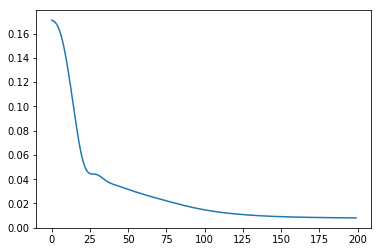

In [37]:
m = create_model()

a = np.arange(num_error).reshape((1,num_error))
b = np.arange(num_sites).reshape((1,num_sites))

targets = np.expand_dims( np.sum(X,axis=0), axis=0)

targets[ targets > 0 ] = 1

from keras_tqdm import TQDMNotebookCallback
h = m.fit(x=[a,b],y=targets, epochs=200, callbacks=[TQDMNotebookCallback()], verbose=0)

import matplotlib.pyplot as plt
% matplotlib inline
plt.plot(h.history['loss'])
axes = plt.gca()
# axes.set_ylim([0,0.02])
plt.show()

In [38]:
error_embedding = m.get_layer(name='error_embed').get_weights()[0]
sites_embedding = m.get_layer(name='sites_embed').get_weights()[0]
print(error_embedding.shape, sites_embedding.shape)
print(X.shape)

(54, 20) (142, 20)
(9522, 54, 142)


In [39]:
X_error = []; X_sites = []
for x in tqdm(range(len(X))):
    e_arr = []
    for i in range(X.shape[1]): # 54
        e_sum = np.sum( X[x,i,:] )
        e_lat = error_embedding[i]
        e = e_lat * e_sum
        e_arr.append(e)
    s_arr = []
    for j in range(X.shape[2]): # 142
        s_sum = np.sum( X[x,:,j] )
        s_lat = sites_embedding[j]
        s = s_lat * s_sum
        s_arr.append(s)
    X_error.append(np.array(e_arr))
    X_sites.append(np.array(s_arr))
X_sites = np.array(X_sites)
X_error = np.array(X_error)
X_new = np.concatenate((X_sites,X_error),axis=1)
print(X_sites.shape, X_error.shape, X_new.shape)

(9522, 142, 20) (9522, 54, 20) (9522, 196, 20)


In [40]:
def create_model():
    m_input = Input((196,20))
    m = m_input

    m_a = Flatten()(m)
    m_a_sites = Dense(units=142, activation='softmax',name='sites_attention')(m_a)
    m_a_error = Dense(units=54, activation='softmax',name='error_attention')(m_a)
    m_a = Concatenate(axis=1)([m_a_sites,m_a_error])
    m_a = Reshape([196,1])(m_a)
    m = multiply([m,m_a])

    m = Flatten()(m)
    for _ in range(3):
        m = Dense(units=50, activation='relu')(m)
        m = Dropout(dropout)(m)
    m_output = Dense(nn_output, activation='softmax')(m)

    model = Model(inputs=m_input,outputs=m_output)
    model.compile( loss=weighted_categorical_crossentropy(class_weights),
#     model.compile( loss=categorical_crossentropy,
                   optimizer=Adam() )
    return model

In [42]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X_new, Y = Y, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed
)
model_name = 'Embed_Att'
save_hist('{}/{}_val.pickle'.format(model_name),val_hist)
save_hist('{}/{}_test.pickle'.format(model_name),test_hist)

Cross Validation on 5 Splits


Testing


### attention output

In [30]:
from keras_tqdm import TQDMNotebookCallback
m = create_model()
h = m.fit(x=X_new, y=Y_action, epochs=50, batch_size=256, validation_split=0.3,
          callbacks=[TQDMNotebookCallback()], verbose=0)

In [31]:
sites_attention = Model(
    inputs = m.input,
    outputs = m.get_layer(name='sites_attention').output
)
error_attention = Model(
    inputs = m.input,
    outputs = m.get_layer(name='error_attention').output
)

In [32]:
# number of errors and their activation output
print('({}) | ({}) | ({})'.format('# of errors','attention for site','attention for error'))
for x,(single_target,new_target) in enumerate(zip(X[:20],X_new[:20])):
    print(x,'=======================')
    new_target = np.expand_dims(new_target,axis=0)
    s = sites_attention.predict(new_target).reshape((142,))
    e = error_attention.predict(new_target).reshape((54,))
    for i in range(X.shape[1]): # 54
        for j in range(X.shape[2]): # 142
            if X[x,i,j] > 0:
                print('{:<7} | {:<7.2f} | {:<7.2f}'.format(X[x,i,j], np.round(s[j],2), np.round(e[i],2)))

(# of errors) | (attention for site) | (attention for error)
0 =======================
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
174.0   | 0.00    | 1.00   
1727.0  | 0.00    | 1.00   
1 =======================
1.0     | 0.03    | 0.04   
1.0     | 0.27    | 0.04   
1.0     | 0.27    | 0.01   
1.0     | 0.00    | 0.54   
2 =======================
1.0     | 0.02    | 0.11   
1.0     | 0.22    | 0.11   
1.0     | 0.03    | 0.11   
1.0     | 0.01    | 0.11   
2.0     | 0.00    | 0.12   
3 =======================
1.0     | 0.04    | 0.05   
1.0     | 0.07    | 0.05   
1.0     | 0.01    | 0.01   
4 =======================
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00 

In [33]:
# biggest activation outputs
print('({}) ({}) ({}) | \n ...same for errors... | \n ({}) ({}) \n'.format(
      'index of biggest site','attention of site','sum of all errors at that site / total errors everywhere',
      'value of # of errors, where indexes are biggest attention','total sum of all errors everywhere'))
for x,(single_target,new_target) in enumerate(zip(X[:20],X_new[:20])):
    print(x,'=======================================================================')
    new_target = np.expand_dims(new_target,axis=0)
    s = sites_attention.predict(new_target).reshape((142,))
    e = error_attention.predict(new_target).reshape((54,))
    s_argmax = np.unravel_index(np.argmax(s), s.shape)
    e_argmax = np.unravel_index(np.argmax(e), e.shape)
    value = X[x,e_argmax,s_argmax][0]
    s_sum = X[x,:,s_argmax].sum()
    e_sum = X[x,e_argmax,:].sum()
    total_sum = X[x,:,:].sum()
    print('{!s:10} {:<7.2f} {:<7} | {!s:10} {:<7.2f} {:<7} | {:<7} {:<7}'.format(
                                            s_argmax, np.round(s[s_argmax],2), np.int(s_sum/total_sum*100),
                                            e_argmax, np.round(e[e_argmax],2), np.int(e_sum/total_sum*100),
                                            value, total_sum))

(index of biggest site) (attention of site) (sum of all errors at that site / total errors everywhere) | 
 ...same for errors... | 
 (value of # of errors, where indexes are biggest attention) (total sum of all errors everywhere) 

0 =======================================================================
(117,)     1.00    0       | (13,)      1.00    99      | 0.0     1904.0 
1 =======================================================================
(46,)      0.27    50      | (47,)      0.54    25      | 0.0     4.0    
2 =======================================================================
(32,)      0.22    16      | (47,)      0.25    0       | 0.0     6.0    
3 =======================================================================
(60,)      0.21    0       | (31,)      0.19    0       | 0.0     3.0    
4 =======================================================================
(81,)      1.00    0       | (26,)      1.00    0       | 0.0     147.0  
5 ==========================

## Embedding ones

In [44]:
num_sites = 142
num_error = 54
num_embed = 20

def create_model():
    sites_input = Input((num_sites,),name='sites_input') # (batch,142,1)
    sites_embed = Embedding(num_sites,num_embed,name='sites_embed')(sites_input) # (batch,142,5)
    error_input = Input((num_error,),name='error_input') # (batch,54,1)
    error_embed = Embedding(num_error,num_embed,name='error_embed')(error_input) # (batch,54,5)
    modl_output = dot(inputs=[error_embed,sites_embed],axes=2) # (batch,54,142)

    model = Model([error_input,sites_input], modl_output)

    model.compile( loss='mse', optimizer = Adam(lr=1e-2) )
    return model

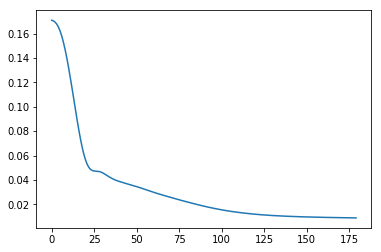

In [46]:
m = create_model()

a = np.arange(num_error).reshape((1,num_error))
b = np.arange(num_sites).reshape((1,num_sites))

targets = np.expand_dims( np.sum(X,axis=0), axis=0)

targets[ targets > 0 ] = 1

from keras_tqdm import TQDMNotebookCallback
h = m.fit(x=[a,b],y=targets, epochs=180, callbacks=[TQDMNotebookCallback()], verbose=0)

import matplotlib.pyplot as plt
% matplotlib inline
plt.plot(h.history['loss'])
axes = plt.gca()
# axes.set_ylim([0,0.02])
plt.show()

In [47]:
error_embedding = m.get_layer(name='error_embed').get_weights()[0]
sites_embedding = m.get_layer(name='sites_embed').get_weights()[0]
print(error_embedding.shape, sites_embedding.shape)
print(X.shape)

(54, 20) (142, 20)
(9522, 54, 142)


In [48]:
X_error = []; X_sites = []
for x in tqdm(range(len(X))):
    e_arr = []
    for i in range(X.shape[1]): # 54
        e_sum = np.sum( X[x,i,:] )
        e_lat = error_embedding[i]
        e = e_lat * e_sum
        e_arr.append(e)
    s_arr = []
    for j in range(X.shape[2]): # 142
        s_sum = np.sum( X[x,:,j] )
        s_lat = sites_embedding[j]
        s = s_lat * s_sum
        s_arr.append(s)
    X_error.append(np.array(e_arr))
    X_sites.append(np.array(s_arr))
X_sites = np.array(X_sites)
X_error = np.array(X_error)
X_new = np.concatenate((X_sites,X_error),axis=1)
print(X_sites.shape, X_error.shape, X_new.shape)

(9522, 142, 20) (9522, 54, 20) (9522, 196, 20)


In [49]:
def create_model():
    m_input = Input((196,20))
    m = m_input
    m = Flatten()(m)
    for _ in range(3):
        m = Dense(units=50, activation='relu')(m)
        m = Dropout(dropout)(m)
    m_output = Dense(nn_output, activation='softmax')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
    model.compile( loss=weighted_categorical_crossentropy(class_weights),
#     model.compile( loss=categorical_crossentropy,
                   optimizer=Adam() )
    return model

In [50]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X_new, Y = Y, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed
)
model_name = 'Embed_wCE'
save_hist('{}/{}_val.pickle'.format(folder_path,model_name),val_hist)
save_hist('{}/{}_test.pickle'.format(folder_path,model_name),test_hist)

Cross Validation on 5 Splits


Testing


## Other

# Memory Models

In [7]:
nn_output = 6
dropout = 0.2
folder_path = 'results/memory'
class_weights = memory_weights
Y = Y_memory

## Categorical Cross Entropy

In [8]:
def create_model():
    m_input = Input((54,142))
    m = m_input
    m = Flatten()(m)
    for _ in range(3):
        m = Dense(units=50, activation='relu')(m)
        m = Dropout(dropout)(m)
    m_output = Dense(nn_output, activation='softmax')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
    model.compile( loss=categorical_crossentropy,
                          optimizer=Adam() )
    return model

In [9]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X, Y = Y, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed,
)
model_name = 'CE'
save_hist('{}/{}_val.pickle'.format(folder_path,model_name),val_hist)
save_hist('{}/{}_test.pickle'.format(folder_path,model_name),test_hist)

Cross Validation on 5 Splits


Testing


## Weighted Categorical Cross Entropy

In [10]:
def create_model():
    m_input = Input((54,142))
    m = m_input
    m = Flatten()(m)
    for _ in range(2):
        m = Dense(units=50, activation='relu')(m)
        m = Dropout(dropout)(m)
    m_output = Dense(nn_output, activation='softmax')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
#     model.compile( loss=categorical_crossentropy,
    model.compile( loss=weighted_categorical_crossentropy(class_weights),
                          optimizer=Adam() )
    return model

In [11]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X, Y = Y, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed,
)
model_name = 'wCE'
save_hist('{}/{}_val.pickle'.format(folder_path,model_name),val_hist)
save_hist('{}/{}_test.pickle'.format(folder_path,model_name),test_hist)

Cross Validation on 5 Splits


Testing


## CNN Weighted CE

In [12]:
num_filters = 64

def create_model():
    m_input = Input((54,142))
    m = m_input
    m = Reshape((54,142,1))(m)
    m_sites = Conv2D(filters=num_filters,kernel_size=(54,1))(m)
    m_sites = Reshape([142*num_filters])(m_sites)
    m_error = Conv2D(filters=num_filters,kernel_size=(1,142))(m)
    m_error = Reshape([54*num_filters])(m_error)
    m = Concatenate()([m_sites,m_error])
    for _ in range(2):
        m = Dense(units=30, activation='relu')(m)
        m = Dropout(dropout)(m)
    m_output = Dense(nn_output, activation='softmax')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
    model.compile( loss=weighted_categorical_crossentropy(class_weights),
#     model.compile( loss=categorical_crossentropy,
                   optimizer=Adam() )
    return model

In [13]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X, Y = Y, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed,
)
model_name = 'CNN_wCE'
save_hist('{}/{}_val.pickle'.format(folder_path,model_name),val_hist)
save_hist('{}/{}_test.pickle'.format(folder_path,model_name),test_hist)

Cross Validation on 5 Splits


Testing


## CNN CE

In [14]:
num_filters = 64

def create_model():
    m_input = Input((54,142))
    m = m_input
    m = Reshape((54,142,1))(m)
    m_sites = Conv2D(filters=num_filters,kernel_size=(54,1))(m)
    m_sites = Reshape([142*num_filters])(m_sites)
    m_error = Conv2D(filters=num_filters,kernel_size=(1,142))(m)
    m_error = Reshape([54*num_filters])(m_error)
    m = Concatenate()([m_sites,m_error])
    for _ in range(3):
        m = Dense(units=30, activation='relu')(m)
        m = Dropout(dropout)(m)
    m_output = Dense(nn_output, activation='softmax')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
#     model.compile( loss=weighted_categorical_crossentropy(class_weights),
    model.compile( loss=categorical_crossentropy,
                   optimizer=Adam() )
    return model

In [15]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X, Y = Y, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed,
)
model_name = 'CNN_CE'
save_hist('{}/{}_val.pickle'.format(folder_path,model_name),val_hist)
save_hist('{}/{}_test.pickle'.format(folder_path,model_name),test_hist)

Cross Validation on 5 Splits


Testing


## CNN wCE w/ Attention

In [16]:
num_filters = 64

def create_model():
    m_input = Input((54,142))
    m = m_input
    m_flatten = Flatten()(m)
    m = Reshape((54,142,1))(m)
    
    m_sites = Conv2D(filters=num_filters,kernel_size=(54,1))(m)
    m_sites = Reshape([142,num_filters])(m_sites)
    m_sites_a = Dense(142,activation='softmax',name='sites_attention')(m_flatten)
    m_sites_a = Reshape([142,1])(m_sites_a)
    m_sites = multiply([m_sites,m_sites_a])
    m_sites = Flatten()(m_sites)
    
    m_error = Conv2D(filters=num_filters,kernel_size=(1,142))(m)
    m_error = Reshape([54,num_filters])(m_error)
    m_error_a = Dense(54,activation='softmax',name='error_attention')(m_flatten)
    m_error_a = Reshape([54,1])(m_error_a)
    m_error = multiply([m_error,m_error_a])
    m_error = Flatten()(m_error)
    
    m = Concatenate()([m_sites,m_error])
    for _ in range(2):
        m = Dense(units=30, activation='relu')(m)
        m = Dropout(dropout)(m)
    m_output = Dense(nn_output, activation='softmax')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
    model.compile( loss=weighted_categorical_crossentropy(class_weights),
#     model.compile( loss=categorical_crossentropy,
                   optimizer=Adam() )
    return model
# create_model().summary()

In [17]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X, Y = Y, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed,
)
model_name = 'CNN_wCE_Att'
save_hist('{}/{}_val.pickle'.format(folder_path,model_name),val_hist)
save_hist('{}/{}_test.pickle'.format(folder_path,model_name),test_hist)

Cross Validation on 5 Splits


Testing


## CNN CE w/ Attention

In [18]:
num_filters = 64

def create_model():
    m_input = Input((54,142))
    m = m_input
    m_flatten = Flatten()(m)
    m = Reshape((54,142,1))(m)
    
    m_sites = Conv2D(filters=num_filters,kernel_size=(54,1))(m)
    m_sites = Reshape([142,num_filters])(m_sites)
    m_sites_a = Dense(142,activation='softmax',name='sites_attention')(m_flatten)
    m_sites_a = Reshape([142,1])(m_sites_a)
    m_sites = multiply([m_sites,m_sites_a])
    m_sites = Flatten()(m_sites)
    
    m_error = Conv2D(filters=num_filters,kernel_size=(1,142))(m)
    m_error = Reshape([54,num_filters])(m_error)
    m_error_a = Dense(54,activation='softmax',name='error_attention')(m_flatten)
    m_error_a = Reshape([54,1])(m_error_a)
    m_error = multiply([m_error,m_error_a])
    m_error = Flatten()(m_error)
    
    m = Concatenate()([m_sites,m_error])
    for _ in range(3):
        m = Dense(units=30, activation='relu')(m)
        m = Dropout(dropout)(m)
    m_output = Dense(nn_output, activation='softmax')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
#     model.compile( loss=weighted_categorical_crossentropy(class_weights),
    model.compile( loss=categorical_crossentropy,
                   optimizer=Adam() )
    return model
# create_model().summary()

In [19]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X, Y = Y, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed,
)
model_name = 'CNN_CE_Att'
save_hist('{}/{}_val.pickle'.format(folder_path,model_name),val_hist)
save_hist('{}/{}_test.pickle'.format(folder_path,model_name),test_hist)

Cross Validation on 5 Splits


Testing


## SMOTE

In [ ]:
def create_model():
    m_input = Input((54,142))
    m = m_input
    m = Flatten()(m)
    for _ in range(3):
        m = Dense(units=50, activation='relu')(m)
        m = Dropout(dropout)(m)
    m_output = Dense(nn_output, activation='softmax')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
    model.compile( loss=categorical_crossentropy,
                          optimizer=Adam() )
    return model

In [ ]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X, Y = Y, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed,
        upsampling=True
)
model_name = 'SMOTE_CE'
save_hist('{}/{}_val.pickle'.format(folder_path,model_name),val_hist)
save_hist('{}/{}_test.pickle'.format(folder_path,model_name),test_hist)

## SMOTE CNN

In [ ]:
num_filters = 64

def create_model():
    m_input = Input((54,142))
    m = m_input
    m = Reshape((54,142,1))(m)
    m_sites = Conv2D(filters=num_filters,kernel_size=(54,1))(m)
    m_sites = Reshape([142*num_filters])(m_sites)
    m_error = Conv2D(filters=num_filters,kernel_size=(1,142))(m)
    m_error = Reshape([54*num_filters])(m_error)
    m = Concatenate()([m_sites,m_error])
    for _ in range(3):
        m = Dense(units=30, activation='relu')(m)
        m = Dropout(dropout)(m)
    m_output = Dense(nn_output, activation='softmax')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
#     model.compile( loss=weighted_categorical_crossentropy(class_weights),
    model.compile( loss=categorical_crossentropy,
                   optimizer=Adam() )
    return model

In [ ]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X, Y = Y, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed,
        upsampling=True
)
model_name = 'SMOTE_CNN'
save_hist('{}/{}_val.pickle'.format(folder_path,model_name),val_hist)
save_hist('{}/{}_test.pickle'.format(folder_path,model_name),test_hist)

## SMOTE CNN w/ Attention

In [ ]:
num_filters = 64

def create_model():
    m_input = Input((54,142))
    m = m_input
    m_flatten = Flatten()(m)
    m = Reshape((54,142,1))(m)
    
    m_sites = Conv2D(filters=num_filters,kernel_size=(54,1))(m)
    m_sites = Reshape([142,num_filters])(m_sites)
    m_sites_a = Dense(142,activation='softmax',name='sites_attention')(m_flatten)
    m_sites_a = Reshape([142,1])(m_sites_a)
    m_sites = multiply([m_sites,m_sites_a])
    m_sites = Flatten()(m_sites)
    
    m_error = Conv2D(filters=num_filters,kernel_size=(1,142))(m)
    m_error = Reshape([54,num_filters])(m_error)
    m_error_a = Dense(54,activation='softmax',name='error_attention')(m_flatten)
    m_error_a = Reshape([54,1])(m_error_a)
    m_error = multiply([m_error,m_error_a])
    m_error = Flatten()(m_error)
    
    m = Concatenate()([m_sites,m_error])
    for _ in range(3):
        m = Dense(units=30, activation='relu')(m)
        m = Dropout(dropout)(m)
    m_output = Dense(nn_output, activation='softmax')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
#     model.compile( loss=weighted_categorical_crossentropy(class_weights),
    model.compile( loss=categorical_crossentropy,
                   optimizer=Adam() )
    return model
# create_model().summary()

In [ ]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X, Y = Y, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed,
        upsampling=True
)
model_name = 'SMOTE_CNN_Att'
save_hist('{}/{}_val.pickle'.format(folder_path,model_name),val_hist)
save_hist('{}/{}_test.pickle'.format(folder_path,model_name),test_hist)

## Embedding w/ Attention

In [20]:
num_sites = 142
num_error = 54
num_embed = 20

def create_model():
    sites_input = Input((num_sites,),name='sites_input') # (batch,142,1)
    sites_embed = Embedding(num_sites,num_embed,name='sites_embed')(sites_input) # (batch,142,5)
    error_input = Input((num_error,),name='error_input') # (batch,54,1)
    error_embed = Embedding(num_error,num_embed,name='error_embed')(error_input) # (batch,54,5)
    modl_output = dot(inputs=[error_embed,sites_embed],axes=2) # (batch,54,142)

    model = Model([error_input,sites_input], modl_output)

    model.compile( loss='mse', optimizer = Adam(lr=1e-2) )
    return model

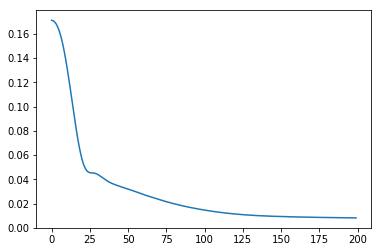

In [21]:
m = create_model()

a = np.arange(num_error).reshape((1,num_error))
b = np.arange(num_sites).reshape((1,num_sites))

targets = np.expand_dims( np.sum(X,axis=0), axis=0)

targets[ targets > 0 ] = 1

from keras_tqdm import TQDMNotebookCallback
h = m.fit(x=[a,b],y=targets, epochs=200, callbacks=[TQDMNotebookCallback()], verbose=0)

import matplotlib.pyplot as plt
% matplotlib inline
plt.plot(h.history['loss'])
axes = plt.gca()
# axes.set_ylim([0,0.02])
plt.show()

In [22]:
error_embedding = m.get_layer(name='error_embed').get_weights()[0]
sites_embedding = m.get_layer(name='sites_embed').get_weights()[0]
print(error_embedding.shape, sites_embedding.shape)
print(X.shape)

(54, 20) (142, 20)
(9522, 54, 142)


In [23]:
X_error = []; X_sites = []
for x in tqdm(range(len(X))):
    e_arr = []
    for i in range(X.shape[1]): # 54
        e_sum = np.sum( X[x,i,:] )
        e_lat = error_embedding[i]
        e = e_lat * e_sum
        e_arr.append(e)
    s_arr = []
    for j in range(X.shape[2]): # 142
        s_sum = np.sum( X[x,:,j] )
        s_lat = sites_embedding[j]
        s = s_lat * s_sum
        s_arr.append(s)
    X_error.append(np.array(e_arr))
    X_sites.append(np.array(s_arr))
X_sites = np.array(X_sites)
X_error = np.array(X_error)
X_new = np.concatenate((X_sites,X_error),axis=1)
print(X_sites.shape, X_error.shape, X_new.shape)


(9522, 142, 20) (9522, 54, 20) (9522, 196, 20)


In [24]:
def create_model():
    m_input = Input((196,20))
    m = m_input

    m_a = Flatten()(m)
    m_a_sites = Dense(units=142, activation='softmax',name='sites_attention')(m_a)
    m_a_error = Dense(units=54, activation='softmax',name='error_attention')(m_a)
    m_a = Concatenate(axis=1)([m_a_sites,m_a_error])
    m_a = Reshape([196,1])(m_a)
    m = multiply([m,m_a])

    m = Flatten()(m)
    for _ in range(3):
        m = Dense(units=50, activation='relu')(m)
        m = Dropout(dropout)(m)
    m_output = Dense(nn_output, activation='softmax')(m)

    model = Model(inputs=m_input,outputs=m_output)
    model.compile( loss=weighted_categorical_crossentropy(class_weights),
#     model.compile( loss=categorical_crossentropy,
                   optimizer=Adam() )
    return model

In [25]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X_new, Y = Y, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed
)
model_name = 'Embed_Att'
save_hist('{}/{}_val.pickle'.format(folder_path,model_name),val_hist)
save_hist('{}/{}_test.pickle'.format(folder_path,model_name),test_hist)

Cross Validation on 5 Splits


Testing


IndexError: tuple index out of range

### attention output

In [ ]:
from keras_tqdm import TQDMNotebookCallback
m = create_model()
h = m.fit(x=X_new, y=Y_action, epochs=50, batch_size=256, validation_split=0.3,
          callbacks=[TQDMNotebookCallback()], verbose=0)

In [31]:
sites_attention = Model(
    inputs = m.input,
    outputs = m.get_layer(name='sites_attention').output
)
error_attention = Model(
    inputs = m.input,
    outputs = m.get_layer(name='error_attention').output
)

In [32]:
# number of errors and their activation output
print('({}) | ({}) | ({})'.format('# of errors','attention for site','attention for error'))
for x,(single_target,new_target) in enumerate(zip(X[:20],X_new[:20])):
    print(x,'=======================')
    new_target = np.expand_dims(new_target,axis=0)
    s = sites_attention.predict(new_target).reshape((142,))
    e = error_attention.predict(new_target).reshape((54,))
    for i in range(X.shape[1]): # 54
        for j in range(X.shape[2]): # 142
            if X[x,i,j] > 0:
                print('{:<7} | {:<7.2f} | {:<7.2f}'.format(X[x,i,j], np.round(s[j],2), np.round(e[i],2)))

(# of errors) | (attention for site) | (attention for error)
0 =======================
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
174.0   | 0.00    | 1.00   
1727.0  | 0.00    | 1.00   
1 =======================
1.0     | 0.03    | 0.04   
1.0     | 0.27    | 0.04   
1.0     | 0.27    | 0.01   
1.0     | 0.00    | 0.54   
2 =======================
1.0     | 0.02    | 0.11   
1.0     | 0.22    | 0.11   
1.0     | 0.03    | 0.11   
1.0     | 0.01    | 0.11   
2.0     | 0.00    | 0.12   
3 =======================
1.0     | 0.04    | 0.05   
1.0     | 0.07    | 0.05   
1.0     | 0.01    | 0.01   
4 =======================
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00 

In [33]:
# biggest activation outputs
print('({}) ({}) ({}) | \n ...same for errors... | \n ({}) ({}) \n'.format(
      'index of biggest site','attention of site','sum of all errors at that site / total errors everywhere',
      'value of # of errors, where indexes are biggest attention','total sum of all errors everywhere'))
for x,(single_target,new_target) in enumerate(zip(X[:20],X_new[:20])):
    print(x,'=======================================================================')
    new_target = np.expand_dims(new_target,axis=0)
    s = sites_attention.predict(new_target).reshape((142,))
    e = error_attention.predict(new_target).reshape((54,))
    s_argmax = np.unravel_index(np.argmax(s), s.shape)
    e_argmax = np.unravel_index(np.argmax(e), e.shape)
    value = X[x,e_argmax,s_argmax][0]
    s_sum = X[x,:,s_argmax].sum()
    e_sum = X[x,e_argmax,:].sum()
    total_sum = X[x,:,:].sum()
    print('{!s:10} {:<7.2f} {:<7} | {!s:10} {:<7.2f} {:<7} | {:<7} {:<7}'.format(
                                            s_argmax, np.round(s[s_argmax],2), np.int(s_sum/total_sum*100),
                                            e_argmax, np.round(e[e_argmax],2), np.int(e_sum/total_sum*100),
                                            value, total_sum))

(index of biggest site) (attention of site) (sum of all errors at that site / total errors everywhere) | 
 ...same for errors... | 
 (value of # of errors, where indexes are biggest attention) (total sum of all errors everywhere) 

0 =======================================================================
(117,)     1.00    0       | (13,)      1.00    99      | 0.0     1904.0 
1 =======================================================================
(46,)      0.27    50      | (47,)      0.54    25      | 0.0     4.0    
2 =======================================================================
(32,)      0.22    16      | (47,)      0.25    0       | 0.0     6.0    
3 =======================================================================
(60,)      0.21    0       | (31,)      0.19    0       | 0.0     3.0    
4 =======================================================================
(81,)      1.00    0       | (26,)      1.00    0       | 0.0     147.0  
5 ==========================

## Embedding ones

In [27]:
num_sites = 142
num_error = 54
num_embed = 20

def create_model():
    sites_input = Input((num_sites,),name='sites_input') # (batch,142,1)
    sites_embed = Embedding(num_sites,num_embed,name='sites_embed')(sites_input) # (batch,142,5)
    error_input = Input((num_error,),name='error_input') # (batch,54,1)
    error_embed = Embedding(num_error,num_embed,name='error_embed')(error_input) # (batch,54,5)
    modl_output = dot(inputs=[error_embed,sites_embed],axes=2) # (batch,54,142)

    model = Model([error_input,sites_input], modl_output)

    model.compile( loss='mse', optimizer = Adam(lr=1e-2) )
    return model

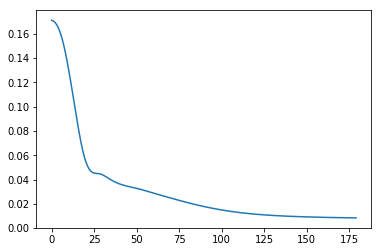

In [28]:
m = create_model()

a = np.arange(num_error).reshape((1,num_error))
b = np.arange(num_sites).reshape((1,num_sites))

targets = np.expand_dims( np.sum(X,axis=0), axis=0)

targets[ targets > 0 ] = 1

from keras_tqdm import TQDMNotebookCallback
h = m.fit(x=[a,b],y=targets, epochs=180, callbacks=[TQDMNotebookCallback()], verbose=0)

import matplotlib.pyplot as plt
% matplotlib inline
plt.plot(h.history['loss'])
axes = plt.gca()
# axes.set_ylim([0,0.02])
plt.show()

In [29]:
error_embedding = m.get_layer(name='error_embed').get_weights()[0]
sites_embedding = m.get_layer(name='sites_embed').get_weights()[0]
print(error_embedding.shape, sites_embedding.shape)
print(X.shape)

(54, 20) (142, 20)
(9522, 54, 142)


In [30]:
X_error = []; X_sites = []
for x in tqdm(range(len(X))):
    e_arr = []
    for i in range(X.shape[1]): # 54
        e_sum = np.sum( X[x,i,:] )
        e_lat = error_embedding[i]
        e = e_lat * e_sum
        e_arr.append(e)
    s_arr = []
    for j in range(X.shape[2]): # 142
        s_sum = np.sum( X[x,:,j] )
        s_lat = sites_embedding[j]
        s = s_lat * s_sum
        s_arr.append(s)
    X_error.append(np.array(e_arr))
    X_sites.append(np.array(s_arr))
X_sites = np.array(X_sites)
X_error = np.array(X_error)
X_new = np.concatenate((X_sites,X_error),axis=1)
print(X_sites.shape, X_error.shape, X_new.shape)


(9522, 142, 20) (9522, 54, 20) (9522, 196, 20)


In [31]:
def create_model():
    m_input = Input((196,20))
    m = m_input
    m = Flatten()(m)
    for _ in range(3):
        m = Dense(units=50, activation='relu')(m)
        m = Dropout(dropout)(m)
    m_output = Dense(nn_output, activation='softmax')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
    model.compile( loss=weighted_categorical_crossentropy(class_weights),
#     model.compile( loss=categorical_crossentropy,
                   optimizer=Adam() )
    return model

In [32]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X_new, Y = Y, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed
)
model_name = 'Embed_wCE'
save_hist('{}/{}_val.pickle'.format(folder_path,model_name),val_hist)
save_hist('{}/{}_test.pickle'.format(folder_path,model_name),test_hist)

Cross Validation on 5 Splits


Testing


## Other

# Splitting Models

In [4]:
nn_output = 3
dropout = 0.2
folder_path = 'results/splitting'
class_weights = splitting_weights
Y = Y_splitting

## Categorical Cross Entropy

In [34]:
def create_model():
    m_input = Input((54,142))
    m = m_input
    m = Flatten()(m)
    for _ in range(3):
        m = Dense(units=50, activation='relu')(m)
        m = Dropout(dropout)(m)
    m_output = Dense(nn_output, activation='softmax')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
    model.compile( loss=categorical_crossentropy,
                          optimizer=Adam() )
    return model

In [35]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X, Y = Y, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed,
)
model_name = 'CE'
save_hist('{}/{}_val.pickle'.format(folder_path,model_name),val_hist)
save_hist('{}/{}_test.pickle'.format(folder_path,model_name),test_hist)

Cross Validation on 5 Splits


Testing


## Weighted Categorical Cross Entropy

In [5]:
def create_model():
    m_input = Input((54,142))
    m = m_input
    m = Flatten()(m)
    for _ in range(2):
        m = Dense(units=50, activation='relu')(m)
        m = Dropout(dropout)(m)
    m_output = Dense(nn_output, activation='softmax')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
#     model.compile( loss=categorical_crossentropy,
    model.compile( loss=weighted_categorical_crossentropy(class_weights),
                          optimizer=Adam() )
    return model

In [6]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X, Y = Y, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed,
)
model_name = 'wCE'
save_hist('{}/{}_val.pickle'.format(folder_path,model_name),val_hist)
save_hist('{}/{}_test.pickle'.format(folder_path,model_name),test_hist)

Cross Validation on 5 Splits


Testing


## CNN Weighted CE

In [7]:
num_filters = 64

def create_model():
    m_input = Input((54,142))
    m = m_input
    m = Reshape((54,142,1))(m)
    m_sites = Conv2D(filters=num_filters,kernel_size=(54,1))(m)
    m_sites = Reshape([142*num_filters])(m_sites)
    m_error = Conv2D(filters=num_filters,kernel_size=(1,142))(m)
    m_error = Reshape([54*num_filters])(m_error)
    m = Concatenate()([m_sites,m_error])
    for _ in range(2):
        m = Dense(units=30, activation='relu')(m)
        m = Dropout(dropout)(m)
    m_output = Dense(nn_output, activation='softmax')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
    model.compile( loss=weighted_categorical_crossentropy(class_weights),
#     model.compile( loss=categorical_crossentropy,
                   optimizer=Adam() )
    return model

In [8]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X, Y = Y, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed,
)
model_name = 'CNN_wCE'
save_hist('{}/{}_val.pickle'.format(folder_path,model_name),val_hist)
save_hist('{}/{}_test.pickle'.format(folder_path,model_name),test_hist)

Cross Validation on 5 Splits


Testing


## CNN CE

In [9]:
num_filters = 64

def create_model():
    m_input = Input((54,142))
    m = m_input
    m = Reshape((54,142,1))(m)
    m_sites = Conv2D(filters=num_filters,kernel_size=(54,1))(m)
    m_sites = Reshape([142*num_filters])(m_sites)
    m_error = Conv2D(filters=num_filters,kernel_size=(1,142))(m)
    m_error = Reshape([54*num_filters])(m_error)
    m = Concatenate()([m_sites,m_error])
    for _ in range(3):
        m = Dense(units=30, activation='relu')(m)
        m = Dropout(dropout)(m)
    m_output = Dense(nn_output, activation='softmax')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
#     model.compile( loss=weighted_categorical_crossentropy(class_weights),
    model.compile( loss=categorical_crossentropy,
                   optimizer=Adam() )
    return model

In [10]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X, Y = Y, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed,
)
model_name = 'CNN_CE'
save_hist('{}/{}_val.pickle'.format(folder_path,model_name),val_hist)
save_hist('{}/{}_test.pickle'.format(folder_path,model_name),test_hist)

Cross Validation on 5 Splits


Testing


## CNN wCE w/ Attention

In [11]:
num_filters = 64

def create_model():
    m_input = Input((54,142))
    m = m_input
    m_flatten = Flatten()(m)
    m = Reshape((54,142,1))(m)
    
    m_sites = Conv2D(filters=num_filters,kernel_size=(54,1))(m)
    m_sites = Reshape([142,num_filters])(m_sites)
    m_sites_a = Dense(142,activation='softmax',name='sites_attention')(m_flatten)
    m_sites_a = Reshape([142,1])(m_sites_a)
    m_sites = multiply([m_sites,m_sites_a])
    m_sites = Flatten()(m_sites)
    
    m_error = Conv2D(filters=num_filters,kernel_size=(1,142))(m)
    m_error = Reshape([54,num_filters])(m_error)
    m_error_a = Dense(54,activation='softmax',name='error_attention')(m_flatten)
    m_error_a = Reshape([54,1])(m_error_a)
    m_error = multiply([m_error,m_error_a])
    m_error = Flatten()(m_error)
    
    m = Concatenate()([m_sites,m_error])
    for _ in range(2):
        m = Dense(units=30, activation='relu')(m)
        m = Dropout(dropout)(m)
    m_output = Dense(nn_output, activation='softmax')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
    model.compile( loss=weighted_categorical_crossentropy(class_weights),
#     model.compile( loss=categorical_crossentropy,
                   optimizer=Adam() )
    return model
# create_model().summary()

In [12]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X, Y = Y, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed,
)
model_name = 'CNN_wCE_Att'
save_hist('{}/{}_val.pickle'.format(folder_path,model_name),val_hist)
save_hist('{}/{}_test.pickle'.format(folder_path,model_name),test_hist)

Cross Validation on 5 Splits


Testing


## CNN CE w/ Attention

In [13]:
num_filters = 64

def create_model():
    m_input = Input((54,142))
    m = m_input
    m_flatten = Flatten()(m)
    m = Reshape((54,142,1))(m)
    
    m_sites = Conv2D(filters=num_filters,kernel_size=(54,1))(m)
    m_sites = Reshape([142,num_filters])(m_sites)
    m_sites_a = Dense(142,activation='softmax',name='sites_attention')(m_flatten)
    m_sites_a = Reshape([142,1])(m_sites_a)
    m_sites = multiply([m_sites,m_sites_a])
    m_sites = Flatten()(m_sites)
    
    m_error = Conv2D(filters=num_filters,kernel_size=(1,142))(m)
    m_error = Reshape([54,num_filters])(m_error)
    m_error_a = Dense(54,activation='softmax',name='error_attention')(m_flatten)
    m_error_a = Reshape([54,1])(m_error_a)
    m_error = multiply([m_error,m_error_a])
    m_error = Flatten()(m_error)
    
    m = Concatenate()([m_sites,m_error])
    for _ in range(3):
        m = Dense(units=30, activation='relu')(m)
        m = Dropout(dropout)(m)
    m_output = Dense(nn_output, activation='softmax')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
#     model.compile( loss=weighted_categorical_crossentropy(class_weights),
    model.compile( loss=categorical_crossentropy,
                   optimizer=Adam() )
    return model
# create_model().summary()

In [14]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X, Y = Y, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed,
)
model_name = 'CNN_CE_Att'
save_hist('{}/{}_val.pickle'.format(folder_path,model_name),val_hist)
save_hist('{}/{}_test.pickle'.format(folder_path,model_name),test_hist)

Cross Validation on 5 Splits


Testing


## SMOTE

In [ ]:
def create_model():
    m_input = Input((54,142))
    m = m_input
    m = Flatten()(m)
    for _ in range(3):
        m = Dense(units=50, activation='relu')(m)
        m = Dropout(dropout)(m)
    m_output = Dense(nn_output, activation='softmax')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
    model.compile( loss=categorical_crossentropy,
                          optimizer=Adam() )
    return model

In [ ]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X, Y = Y, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed,
        upsampling=True
)
model_name = 'SMOTE_CE'
save_hist('{}/{}_val.pickle'.format(folder_path,model_name),val_hist)
save_hist('{}/{}_test.pickle'.format(folder_path,model_name),test_hist)

## SMOTE CNN

In [ ]:
num_filters = 64

def create_model():
    m_input = Input((54,142))
    m = m_input
    m = Reshape((54,142,1))(m)
    m_sites = Conv2D(filters=num_filters,kernel_size=(54,1))(m)
    m_sites = Reshape([142*num_filters])(m_sites)
    m_error = Conv2D(filters=num_filters,kernel_size=(1,142))(m)
    m_error = Reshape([54*num_filters])(m_error)
    m = Concatenate()([m_sites,m_error])
    for _ in range(3):
        m = Dense(units=30, activation='relu')(m)
        m = Dropout(dropout)(m)
    m_output = Dense(nn_output, activation='softmax')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
#     model.compile( loss=weighted_categorical_crossentropy(class_weights),
    model.compile( loss=categorical_crossentropy,
                   optimizer=Adam() )
    return model

In [ ]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X, Y = Y, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed,
        upsampling=True
)
model_name = 'SMOTE_CNN'
save_hist('{}/{}_val.pickle'.format(folder_path,model_name),val_hist)
save_hist('{}/{}_test.pickle'.format(folder_path,model_name),test_hist)

## SMOTE CNN w/ Attention

In [ ]:
num_filters = 64

def create_model():
    m_input = Input((54,142))
    m = m_input
    m_flatten = Flatten()(m)
    m = Reshape((54,142,1))(m)
    
    m_sites = Conv2D(filters=num_filters,kernel_size=(54,1))(m)
    m_sites = Reshape([142,num_filters])(m_sites)
    m_sites_a = Dense(142,activation='softmax',name='sites_attention')(m_flatten)
    m_sites_a = Reshape([142,1])(m_sites_a)
    m_sites = multiply([m_sites,m_sites_a])
    m_sites = Flatten()(m_sites)
    
    m_error = Conv2D(filters=num_filters,kernel_size=(1,142))(m)
    m_error = Reshape([54,num_filters])(m_error)
    m_error_a = Dense(54,activation='softmax',name='error_attention')(m_flatten)
    m_error_a = Reshape([54,1])(m_error_a)
    m_error = multiply([m_error,m_error_a])
    m_error = Flatten()(m_error)
    
    m = Concatenate()([m_sites,m_error])
    for _ in range(3):
        m = Dense(units=30, activation='relu')(m)
        m = Dropout(dropout)(m)
    m_output = Dense(nn_output, activation='softmax')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
#     model.compile( loss=weighted_categorical_crossentropy(class_weights),
    model.compile( loss=categorical_crossentropy,
                   optimizer=Adam() )
    return model
# create_model().summary()

In [ ]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X, Y = Y, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed,
        upsampling=True
)
model_name = 'SMOTE_CNN_Att'
save_hist('{}/{}_val.pickle'.format(folder_path,model_name),val_hist)
save_hist('{}/{}_test.pickle'.format(folder_path,model_name),test_hist)

## Embedding w/ Attention

In [15]:
num_sites = 142
num_error = 54
num_embed = 20

def create_model():
    sites_input = Input((num_sites,),name='sites_input') # (batch,142,1)
    sites_embed = Embedding(num_sites,num_embed,name='sites_embed')(sites_input) # (batch,142,5)
    error_input = Input((num_error,),name='error_input') # (batch,54,1)
    error_embed = Embedding(num_error,num_embed,name='error_embed')(error_input) # (batch,54,5)
    modl_output = dot(inputs=[error_embed,sites_embed],axes=2) # (batch,54,142)

    model = Model([error_input,sites_input], modl_output)

    model.compile( loss='mse', optimizer = Adam(lr=1e-2) )
    return model

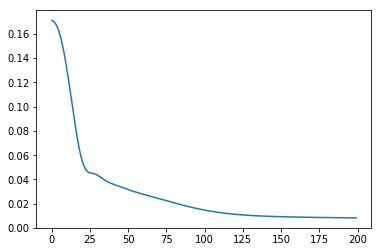

In [16]:
m = create_model()

a = np.arange(num_error).reshape((1,num_error))
b = np.arange(num_sites).reshape((1,num_sites))

targets = np.expand_dims( np.sum(X,axis=0), axis=0)

targets[ targets > 0 ] = 1

from keras_tqdm import TQDMNotebookCallback
h = m.fit(x=[a,b],y=targets, epochs=200, callbacks=[TQDMNotebookCallback()], verbose=0)

import matplotlib.pyplot as plt
% matplotlib inline
plt.plot(h.history['loss'])
axes = plt.gca()
# axes.set_ylim([0,0.02])
plt.show()

In [17]:
error_embedding = m.get_layer(name='error_embed').get_weights()[0]
sites_embedding = m.get_layer(name='sites_embed').get_weights()[0]
print(error_embedding.shape, sites_embedding.shape)
print(X.shape)

(54, 20) (142, 20)
(9522, 54, 142)


In [18]:
X_error = []; X_sites = []
for x in tqdm(range(len(X))):
    e_arr = []
    for i in range(X.shape[1]): # 54
        e_sum = np.sum( X[x,i,:] )
        e_lat = error_embedding[i]
        e = e_lat * e_sum
        e_arr.append(e)
    s_arr = []
    for j in range(X.shape[2]): # 142
        s_sum = np.sum( X[x,:,j] )
        s_lat = sites_embedding[j]
        s = s_lat * s_sum
        s_arr.append(s)
    X_error.append(np.array(e_arr))
    X_sites.append(np.array(s_arr))
X_sites = np.array(X_sites)
X_error = np.array(X_error)
X_new = np.concatenate((X_sites,X_error),axis=1)
print(X_sites.shape, X_error.shape, X_new.shape)


(9522, 142, 20) (9522, 54, 20) (9522, 196, 20)


In [19]:
def create_model():
    m_input = Input((196,20))
    m = m_input

    m_a = Flatten()(m)
    m_a_sites = Dense(units=142, activation='softmax',name='sites_attention')(m_a)
    m_a_error = Dense(units=54, activation='softmax',name='error_attention')(m_a)
    m_a = Concatenate(axis=1)([m_a_sites,m_a_error])
    m_a = Reshape([196,1])(m_a)
    m = multiply([m,m_a])

    m = Flatten()(m)
    for _ in range(3):
        m = Dense(units=50, activation='relu')(m)
        m = Dropout(dropout)(m)
    m_output = Dense(nn_output, activation='softmax')(m)

    model = Model(inputs=m_input,outputs=m_output)
    model.compile( loss=weighted_categorical_crossentropy(class_weights),
#     model.compile( loss=categorical_crossentropy,
                   optimizer=Adam() )
    return model

In [20]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X_new, Y = Y, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed
)
model_name = 'Embed_Att'
save_hist('{}/{}_val.pickle'.format(folder_path,model_name),val_hist)
save_hist('{}/{}_test.pickle'.format(folder_path,model_name),test_hist)

Cross Validation on 5 Splits


Testing


IndexError: tuple index out of range

### attention output

In [30]:
from keras_tqdm import TQDMNotebookCallback
m = create_model()
h = m.fit(x=X_new, y=Y_action, epochs=50, batch_size=256, validation_split=0.3,
          callbacks=[TQDMNotebookCallback()], verbose=0)

In [31]:
sites_attention = Model(
    inputs = m.input,
    outputs = m.get_layer(name='sites_attention').output
)
error_attention = Model(
    inputs = m.input,
    outputs = m.get_layer(name='error_attention').output
)

In [32]:
# number of errors and their activation output
print('({}) | ({}) | ({})'.format('# of errors','attention for site','attention for error'))
for x,(single_target,new_target) in enumerate(zip(X[:20],X_new[:20])):
    print(x,'=======================')
    new_target = np.expand_dims(new_target,axis=0)
    s = sites_attention.predict(new_target).reshape((142,))
    e = error_attention.predict(new_target).reshape((54,))
    for i in range(X.shape[1]): # 54
        for j in range(X.shape[2]): # 142
            if X[x,i,j] > 0:
                print('{:<7} | {:<7.2f} | {:<7.2f}'.format(X[x,i,j], np.round(s[j],2), np.round(e[i],2)))

(# of errors) | (attention for site) | (attention for error)
0 =======================
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
174.0   | 0.00    | 1.00   
1727.0  | 0.00    | 1.00   
1 =======================
1.0     | 0.03    | 0.04   
1.0     | 0.27    | 0.04   
1.0     | 0.27    | 0.01   
1.0     | 0.00    | 0.54   
2 =======================
1.0     | 0.02    | 0.11   
1.0     | 0.22    | 0.11   
1.0     | 0.03    | 0.11   
1.0     | 0.01    | 0.11   
2.0     | 0.00    | 0.12   
3 =======================
1.0     | 0.04    | 0.05   
1.0     | 0.07    | 0.05   
1.0     | 0.01    | 0.01   
4 =======================
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00 

In [33]:
# biggest activation outputs
print('({}) ({}) ({}) | \n ...same for errors... | \n ({}) ({}) \n'.format(
      'index of biggest site','attention of site','sum of all errors at that site / total errors everywhere',
      'value of # of errors, where indexes are biggest attention','total sum of all errors everywhere'))
for x,(single_target,new_target) in enumerate(zip(X[:20],X_new[:20])):
    print(x,'=======================================================================')
    new_target = np.expand_dims(new_target,axis=0)
    s = sites_attention.predict(new_target).reshape((142,))
    e = error_attention.predict(new_target).reshape((54,))
    s_argmax = np.unravel_index(np.argmax(s), s.shape)
    e_argmax = np.unravel_index(np.argmax(e), e.shape)
    value = X[x,e_argmax,s_argmax][0]
    s_sum = X[x,:,s_argmax].sum()
    e_sum = X[x,e_argmax,:].sum()
    total_sum = X[x,:,:].sum()
    print('{!s:10} {:<7.2f} {:<7} | {!s:10} {:<7.2f} {:<7} | {:<7} {:<7}'.format(
                                            s_argmax, np.round(s[s_argmax],2), np.int(s_sum/total_sum*100),
                                            e_argmax, np.round(e[e_argmax],2), np.int(e_sum/total_sum*100),
                                            value, total_sum))

(index of biggest site) (attention of site) (sum of all errors at that site / total errors everywhere) | 
 ...same for errors... | 
 (value of # of errors, where indexes are biggest attention) (total sum of all errors everywhere) 

0 =======================================================================
(117,)     1.00    0       | (13,)      1.00    99      | 0.0     1904.0 
1 =======================================================================
(46,)      0.27    50      | (47,)      0.54    25      | 0.0     4.0    
2 =======================================================================
(32,)      0.22    16      | (47,)      0.25    0       | 0.0     6.0    
3 =======================================================================
(60,)      0.21    0       | (31,)      0.19    0       | 0.0     3.0    
4 =======================================================================
(81,)      1.00    0       | (26,)      1.00    0       | 0.0     147.0  
5 ==========================

## Embedding ones

In [5]:
num_sites = 142
num_error = 54
num_embed = 20

def create_model():
    sites_input = Input((num_sites,),name='sites_input') # (batch,142,1)
    sites_embed = Embedding(num_sites,num_embed,name='sites_embed')(sites_input) # (batch,142,5)
    error_input = Input((num_error,),name='error_input') # (batch,54,1)
    error_embed = Embedding(num_error,num_embed,name='error_embed')(error_input) # (batch,54,5)
    modl_output = dot(inputs=[error_embed,sites_embed],axes=2) # (batch,54,142)

    model = Model([error_input,sites_input], modl_output)

    model.compile( loss='mse', optimizer = Adam(lr=1e-2) )
    return model

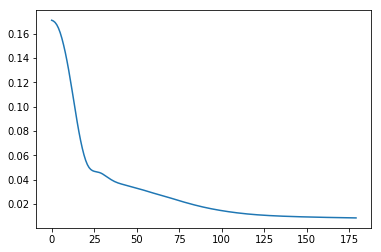

In [6]:
m = create_model()

a = np.arange(num_error).reshape((1,num_error))
b = np.arange(num_sites).reshape((1,num_sites))

targets = np.expand_dims( np.sum(X,axis=0), axis=0)

targets[ targets > 0 ] = 1

from keras_tqdm import TQDMNotebookCallback
h = m.fit(x=[a,b],y=targets, epochs=180, callbacks=[TQDMNotebookCallback()], verbose=0)

import matplotlib.pyplot as plt
% matplotlib inline
plt.plot(h.history['loss'])
axes = plt.gca()
# axes.set_ylim([0,0.02])
plt.show()

In [7]:
error_embedding = m.get_layer(name='error_embed').get_weights()[0]
sites_embedding = m.get_layer(name='sites_embed').get_weights()[0]
print(error_embedding.shape, sites_embedding.shape)
print(X.shape)

(54, 20) (142, 20)
(9522, 54, 142)


In [8]:
X_error = []; X_sites = []
for x in tqdm(range(len(X))):
    e_arr = []
    for i in range(X.shape[1]): # 54
        e_sum = np.sum( X[x,i,:] )
        e_lat = error_embedding[i]
        e = e_lat * e_sum
        e_arr.append(e)
    s_arr = []
    for j in range(X.shape[2]): # 142
        s_sum = np.sum( X[x,:,j] )
        s_lat = sites_embedding[j]
        s = s_lat * s_sum
        s_arr.append(s)
    X_error.append(np.array(e_arr))
    X_sites.append(np.array(s_arr))
X_sites = np.array(X_sites)
X_error = np.array(X_error)
X_new = np.concatenate((X_sites,X_error),axis=1)
print(X_sites.shape, X_error.shape, X_new.shape)


(9522, 142, 20) (9522, 54, 20) (9522, 196, 20)


In [9]:
def create_model():
    m_input = Input((196,20))
    m = m_input
    m = Flatten()(m)
    for _ in range(3):
        m = Dense(units=50, activation='relu')(m)
        m = Dropout(dropout)(m)
    m_output = Dense(nn_output, activation='softmax')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
    model.compile( loss=weighted_categorical_crossentropy(class_weights),
#     model.compile( loss=categorical_crossentropy,
                   optimizer=Adam() )
    return model

In [10]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X_new, Y = Y, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed
)
model_name = 'Embed_wCE'
save_hist('{}/{}_val.pickle'.format(folder_path,model_name),val_hist)
save_hist('{}/{}_test.pickle'.format(folder_path,model_name),test_hist)

Cross Validation on 5 Splits


Testing


## Other

# xrootd Models

In [11]:
nn_output = 3
dropout = 0.2
folder_path = 'results/xrootd'
class_weights = xrootd_weights
Y = Y_xrootd

## Categorical Cross Entropy

In [12]:
def create_model():
    m_input = Input((54,142))
    m = m_input
    m = Flatten()(m)
    for _ in range(3):
        m = Dense(units=50, activation='relu')(m)
        m = Dropout(dropout)(m)
    m_output = Dense(nn_output, activation='softmax')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
    model.compile( loss=categorical_crossentropy,
                          optimizer=Adam() )
    return model

In [13]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X, Y = Y, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed,
)
model_name = 'CE'
save_hist('{}/{}_val.pickle'.format(folder_path,model_name),val_hist)
save_hist('{}/{}_test.pickle'.format(folder_path,model_name),test_hist)

Cross Validation on 5 Splits


Testing


## Weighted Categorical Cross Entropy

In [14]:
def create_model():
    m_input = Input((54,142))
    m = m_input
    m = Flatten()(m)
    for _ in range(2):
        m = Dense(units=50, activation='relu')(m)
        m = Dropout(dropout)(m)
    m_output = Dense(nn_output, activation='softmax')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
#     model.compile( loss=categorical_crossentropy,
    model.compile( loss=weighted_categorical_crossentropy(class_weights),
                          optimizer=Adam() )
    return model

In [15]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X, Y = Y, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed,
)
model_name = 'wCE'
save_hist('{}/{}_val.pickle'.format(folder_path,model_name),val_hist)
save_hist('{}/{}_test.pickle'.format(folder_path,model_name),test_hist)

Cross Validation on 5 Splits


Testing


## CNN Weighted CE

In [16]:
num_filters = 64

def create_model():
    m_input = Input((54,142))
    m = m_input
    m = Reshape((54,142,1))(m)
    m_sites = Conv2D(filters=num_filters,kernel_size=(54,1))(m)
    m_sites = Reshape([142*num_filters])(m_sites)
    m_error = Conv2D(filters=num_filters,kernel_size=(1,142))(m)
    m_error = Reshape([54*num_filters])(m_error)
    m = Concatenate()([m_sites,m_error])
    for _ in range(2):
        m = Dense(units=30, activation='relu')(m)
        m = Dropout(dropout)(m)
    m_output = Dense(nn_output, activation='softmax')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
    model.compile( loss=weighted_categorical_crossentropy(class_weights),
#     model.compile( loss=categorical_crossentropy,
                   optimizer=Adam() )
    return model

In [17]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X, Y = Y, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed,
)
model_name = 'CNN_wCE'
save_hist('{}/{}_val.pickle'.format(folder_path,model_name),val_hist)
save_hist('{}/{}_test.pickle'.format(folder_path,model_name),test_hist)

Cross Validation on 5 Splits


Testing


## CNN CE

In [18]:
num_filters = 64

def create_model():
    m_input = Input((54,142))
    m = m_input
    m = Reshape((54,142,1))(m)
    m_sites = Conv2D(filters=num_filters,kernel_size=(54,1))(m)
    m_sites = Reshape([142*num_filters])(m_sites)
    m_error = Conv2D(filters=num_filters,kernel_size=(1,142))(m)
    m_error = Reshape([54*num_filters])(m_error)
    m = Concatenate()([m_sites,m_error])
    for _ in range(3):
        m = Dense(units=30, activation='relu')(m)
        m = Dropout(dropout)(m)
    m_output = Dense(nn_output, activation='softmax')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
#     model.compile( loss=weighted_categorical_crossentropy(class_weights),
    model.compile( loss=categorical_crossentropy,
                   optimizer=Adam() )
    return model

In [19]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X, Y = Y, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed,
)
model_name = 'CNN_CE'
save_hist('{}/{}_val.pickle'.format(folder_path,model_name),val_hist)
save_hist('{}/{}_test.pickle'.format(folder_path,model_name),test_hist)

Cross Validation on 5 Splits


Testing


## CNN wCE w/ Attention

In [20]:
num_filters = 64

def create_model():
    m_input = Input((54,142))
    m = m_input
    m_flatten = Flatten()(m)
    m = Reshape((54,142,1))(m)
    
    m_sites = Conv2D(filters=num_filters,kernel_size=(54,1))(m)
    m_sites = Reshape([142,num_filters])(m_sites)
    m_sites_a = Dense(142,activation='softmax',name='sites_attention')(m_flatten)
    m_sites_a = Reshape([142,1])(m_sites_a)
    m_sites = multiply([m_sites,m_sites_a])
    m_sites = Flatten()(m_sites)
    
    m_error = Conv2D(filters=num_filters,kernel_size=(1,142))(m)
    m_error = Reshape([54,num_filters])(m_error)
    m_error_a = Dense(54,activation='softmax',name='error_attention')(m_flatten)
    m_error_a = Reshape([54,1])(m_error_a)
    m_error = multiply([m_error,m_error_a])
    m_error = Flatten()(m_error)
    
    m = Concatenate()([m_sites,m_error])
    for _ in range(2):
        m = Dense(units=30, activation='relu')(m)
        m = Dropout(dropout)(m)
    m_output = Dense(nn_output, activation='softmax')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
    model.compile( loss=weighted_categorical_crossentropy(class_weights),
#     model.compile( loss=categorical_crossentropy,
                   optimizer=Adam() )
    return model
# create_model().summary()

In [21]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X, Y = Y, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed,
)
model_name = 'CNN_wCE_Att'
save_hist('{}/{}_val.pickle'.format(folder_path,model_name),val_hist)
save_hist('{}/{}_test.pickle'.format(folder_path,model_name),test_hist)

Cross Validation on 5 Splits


Testing


## CNN CE w/ Attention

In [22]:
num_filters = 64

def create_model():
    m_input = Input((54,142))
    m = m_input
    m_flatten = Flatten()(m)
    m = Reshape((54,142,1))(m)
    
    m_sites = Conv2D(filters=num_filters,kernel_size=(54,1))(m)
    m_sites = Reshape([142,num_filters])(m_sites)
    m_sites_a = Dense(142,activation='softmax',name='sites_attention')(m_flatten)
    m_sites_a = Reshape([142,1])(m_sites_a)
    m_sites = multiply([m_sites,m_sites_a])
    m_sites = Flatten()(m_sites)
    
    m_error = Conv2D(filters=num_filters,kernel_size=(1,142))(m)
    m_error = Reshape([54,num_filters])(m_error)
    m_error_a = Dense(54,activation='softmax',name='error_attention')(m_flatten)
    m_error_a = Reshape([54,1])(m_error_a)
    m_error = multiply([m_error,m_error_a])
    m_error = Flatten()(m_error)
    
    m = Concatenate()([m_sites,m_error])
    for _ in range(3):
        m = Dense(units=30, activation='relu')(m)
        m = Dropout(dropout)(m)
    m_output = Dense(nn_output, activation='softmax')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
#     model.compile( loss=weighted_categorical_crossentropy(class_weights),
    model.compile( loss=categorical_crossentropy,
                   optimizer=Adam() )
    return model
# create_model().summary()

In [23]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X, Y = Y, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed,
)
model_name = 'CNN_CE_Att'
save_hist('{}/{}_val.pickle'.format(folder_path,model_name),val_hist)
save_hist('{}/{}_test.pickle'.format(folder_path,model_name),test_hist)

Cross Validation on 5 Splits


KeyboardInterrupt: 

## SMOTE

In [ ]:
def create_model():
    m_input = Input((54,142))
    m = m_input
    m = Flatten()(m)
    for _ in range(3):
        m = Dense(units=50, activation='relu')(m)
        m = Dropout(dropout)(m)
    m_output = Dense(nn_output, activation='softmax')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
    model.compile( loss=categorical_crossentropy,
                          optimizer=Adam() )
    return model

In [ ]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X, Y = Y, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed,
        upsampling=True
)
model_name = 'SMOTE_CE'
save_hist('{}/{}_val.pickle'.format(folder_path,model_name),val_hist)
save_hist('{}/{}_test.pickle'.format(folder_path,model_name),test_hist)

## SMOTE CNN

In [ ]:
num_filters = 64

def create_model():
    m_input = Input((54,142))
    m = m_input
    m = Reshape((54,142,1))(m)
    m_sites = Conv2D(filters=num_filters,kernel_size=(54,1))(m)
    m_sites = Reshape([142*num_filters])(m_sites)
    m_error = Conv2D(filters=num_filters,kernel_size=(1,142))(m)
    m_error = Reshape([54*num_filters])(m_error)
    m = Concatenate()([m_sites,m_error])
    for _ in range(3):
        m = Dense(units=30, activation='relu')(m)
        m = Dropout(dropout)(m)
    m_output = Dense(nn_output, activation='softmax')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
#     model.compile( loss=weighted_categorical_crossentropy(class_weights),
    model.compile( loss=categorical_crossentropy,
                   optimizer=Adam() )
    return model

In [ ]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X, Y = Y, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed,
        upsampling=True
)
model_name = 'SMOTE_CNN'
save_hist('{}/{}_val.pickle'.format(folder_path,model_name),val_hist)
save_hist('{}/{}_test.pickle'.format(folder_path,model_name),test_hist)

## SMOTE CNN w/ Attention

In [ ]:
num_filters = 64

def create_model():
    m_input = Input((54,142))
    m = m_input
    m_flatten = Flatten()(m)
    m = Reshape((54,142,1))(m)
    
    m_sites = Conv2D(filters=num_filters,kernel_size=(54,1))(m)
    m_sites = Reshape([142,num_filters])(m_sites)
    m_sites_a = Dense(142,activation='softmax',name='sites_attention')(m_flatten)
    m_sites_a = Reshape([142,1])(m_sites_a)
    m_sites = multiply([m_sites,m_sites_a])
    m_sites = Flatten()(m_sites)
    
    m_error = Conv2D(filters=num_filters,kernel_size=(1,142))(m)
    m_error = Reshape([54,num_filters])(m_error)
    m_error_a = Dense(54,activation='softmax',name='error_attention')(m_flatten)
    m_error_a = Reshape([54,1])(m_error_a)
    m_error = multiply([m_error,m_error_a])
    m_error = Flatten()(m_error)
    
    m = Concatenate()([m_sites,m_error])
    for _ in range(3):
        m = Dense(units=30, activation='relu')(m)
        m = Dropout(dropout)(m)
    m_output = Dense(nn_output, activation='softmax')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
#     model.compile( loss=weighted_categorical_crossentropy(class_weights),
    model.compile( loss=categorical_crossentropy,
                   optimizer=Adam() )
    return model
# create_model().summary()

In [ ]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X, Y = Y, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed,
        upsampling=True
)
model_name = 'SMOTE_CNN_Att'
save_hist('{}/{}_val.pickle'.format(folder_path,model_name),val_hist)
save_hist('{}/{}_test.pickle'.format(folder_path,model_name),test_hist)

## Embedding w/ Attention

In [ ]:
num_sites = 142
num_error = 54
num_embed = 20

def create_model():
    sites_input = Input((num_sites,),name='sites_input') # (batch,142,1)
    sites_embed = Embedding(num_sites,num_embed,name='sites_embed')(sites_input) # (batch,142,5)
    error_input = Input((num_error,),name='error_input') # (batch,54,1)
    error_embed = Embedding(num_error,num_embed,name='error_embed')(error_input) # (batch,54,5)
    modl_output = dot(inputs=[error_embed,sites_embed],axes=2) # (batch,54,142)

    model = Model([error_input,sites_input], modl_output)

    model.compile( loss='mse', optimizer = Adam(lr=1e-2) )
    return model

In [ ]:
m = create_model()

a = np.arange(num_error).reshape((1,num_error))
b = np.arange(num_sites).reshape((1,num_sites))

targets = np.expand_dims( np.sum(X,axis=0), axis=0)

targets[ targets > 0 ] = 1

from keras_tqdm import TQDMNotebookCallback
h = m.fit(x=[a,b],y=targets, epochs=200, callbacks=[TQDMNotebookCallback()], verbose=0)

import matplotlib.pyplot as plt
% matplotlib inline
plt.plot(h.history['loss'])
axes = plt.gca()
# axes.set_ylim([0,0.02])
plt.show()

In [ ]:
error_embedding = m.get_layer(name='error_embed').get_weights()[0]
sites_embedding = m.get_layer(name='sites_embed').get_weights()[0]
print(error_embedding.shape, sites_embedding.shape)
print(X.shape)

In [ ]:
X_error = []; X_sites = []
for x in tqdm(range(len(X))):
    e_arr = []
    for i in range(X.shape[1]): # 54
        e_sum = np.sum( X[x,i,:] )
        e_lat = error_embedding[i]
        e = e_lat * e_sum
        e_arr.append(e)
    s_arr = []
    for j in range(X.shape[2]): # 142
        s_sum = np.sum( X[x,:,j] )
        s_lat = sites_embedding[j]
        s = s_lat * s_sum
        s_arr.append(s)
    X_error.append(np.array(e_arr))
    X_sites.append(np.array(s_arr))
X_sites = np.array(X_sites)
X_error = np.array(X_error)
X_new = np.concatenate((X_sites,X_error),axis=1)
print(X_sites.shape, X_error.shape, X_new.shape)

In [ ]:
def create_model():
    m_input = Input((196,20))
    m = m_input

    m_a = Flatten()(m)
    m_a_sites = Dense(units=142, activation='softmax',name='sites_attention')(m_a)
    m_a_error = Dense(units=54, activation='softmax',name='error_attention')(m_a)
    m_a = Concatenate(axis=1)([m_a_sites,m_a_error])
    m_a = Reshape([196,1])(m_a)
    m = multiply([m,m_a])

    m = Flatten()(m)
    for _ in range(3):
        m = Dense(units=50, activation='relu')(m)
        m = Dropout(dropout)(m)
    m_output = Dense(nn_output, activation='softmax')(m)

    model = Model(inputs=m_input,outputs=m_output)
    model.compile( loss=weighted_categorical_crossentropy(class_weights),
#     model.compile( loss=categorical_crossentropy,
                   optimizer=Adam() )
    return model

In [ ]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X_new, Y = Y, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed
)
model_name = 'Embed_Att'
save_hist('{}/{}_val.pickle'.format(folder_path,model_name),val_hist)
save_hist('{}/{}_test.pickle'.format(folder_path,model_name),test_hist)

### attention output

In [30]:
from keras_tqdm import TQDMNotebookCallback
m = create_model()
h = m.fit(x=X_new, y=Y_action, epochs=50, batch_size=256, validation_split=0.3,
          callbacks=[TQDMNotebookCallback()], verbose=0)

In [31]:
sites_attention = Model(
    inputs = m.input,
    outputs = m.get_layer(name='sites_attention').output
)
error_attention = Model(
    inputs = m.input,
    outputs = m.get_layer(name='error_attention').output
)

In [32]:
# number of errors and their activation output
print('({}) | ({}) | ({})'.format('# of errors','attention for site','attention for error'))
for x,(single_target,new_target) in enumerate(zip(X[:20],X_new[:20])):
    print(x,'=======================')
    new_target = np.expand_dims(new_target,axis=0)
    s = sites_attention.predict(new_target).reshape((142,))
    e = error_attention.predict(new_target).reshape((54,))
    for i in range(X.shape[1]): # 54
        for j in range(X.shape[2]): # 142
            if X[x,i,j] > 0:
                print('{:<7} | {:<7.2f} | {:<7.2f}'.format(X[x,i,j], np.round(s[j],2), np.round(e[i],2)))

(# of errors) | (attention for site) | (attention for error)
0 =======================
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
174.0   | 0.00    | 1.00   
1727.0  | 0.00    | 1.00   
1 =======================
1.0     | 0.03    | 0.04   
1.0     | 0.27    | 0.04   
1.0     | 0.27    | 0.01   
1.0     | 0.00    | 0.54   
2 =======================
1.0     | 0.02    | 0.11   
1.0     | 0.22    | 0.11   
1.0     | 0.03    | 0.11   
1.0     | 0.01    | 0.11   
2.0     | 0.00    | 0.12   
3 =======================
1.0     | 0.04    | 0.05   
1.0     | 0.07    | 0.05   
1.0     | 0.01    | 0.01   
4 =======================
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00   
1.0     | 0.00    | 0.00 

In [33]:
# biggest activation outputs
print('({}) ({}) ({}) | \n ...same for errors... | \n ({}) ({}) \n'.format(
      'index of biggest site','attention of site','sum of all errors at that site / total errors everywhere',
      'value of # of errors, where indexes are biggest attention','total sum of all errors everywhere'))
for x,(single_target,new_target) in enumerate(zip(X[:20],X_new[:20])):
    print(x,'=======================================================================')
    new_target = np.expand_dims(new_target,axis=0)
    s = sites_attention.predict(new_target).reshape((142,))
    e = error_attention.predict(new_target).reshape((54,))
    s_argmax = np.unravel_index(np.argmax(s), s.shape)
    e_argmax = np.unravel_index(np.argmax(e), e.shape)
    value = X[x,e_argmax,s_argmax][0]
    s_sum = X[x,:,s_argmax].sum()
    e_sum = X[x,e_argmax,:].sum()
    total_sum = X[x,:,:].sum()
    print('{!s:10} {:<7.2f} {:<7} | {!s:10} {:<7.2f} {:<7} | {:<7} {:<7}'.format(
                                            s_argmax, np.round(s[s_argmax],2), np.int(s_sum/total_sum*100),
                                            e_argmax, np.round(e[e_argmax],2), np.int(e_sum/total_sum*100),
                                            value, total_sum))

(index of biggest site) (attention of site) (sum of all errors at that site / total errors everywhere) | 
 ...same for errors... | 
 (value of # of errors, where indexes are biggest attention) (total sum of all errors everywhere) 

0 =======================================================================
(117,)     1.00    0       | (13,)      1.00    99      | 0.0     1904.0 
1 =======================================================================
(46,)      0.27    50      | (47,)      0.54    25      | 0.0     4.0    
2 =======================================================================
(32,)      0.22    16      | (47,)      0.25    0       | 0.0     6.0    
3 =======================================================================
(60,)      0.21    0       | (31,)      0.19    0       | 0.0     3.0    
4 =======================================================================
(81,)      1.00    0       | (26,)      1.00    0       | 0.0     147.0  
5 ==========================

## Embedding ones

In [ ]:
num_sites = 142
num_error = 54
num_embed = 20

def create_model():
    sites_input = Input((num_sites,),name='sites_input') # (batch,142,1)
    sites_embed = Embedding(num_sites,num_embed,name='sites_embed')(sites_input) # (batch,142,5)
    error_input = Input((num_error,),name='error_input') # (batch,54,1)
    error_embed = Embedding(num_error,num_embed,name='error_embed')(error_input) # (batch,54,5)
    modl_output = dot(inputs=[error_embed,sites_embed],axes=2) # (batch,54,142)

    model = Model([error_input,sites_input], modl_output)

    model.compile( loss='mse', optimizer = Adam(lr=1e-2) )
    return model

In [ ]:
m = create_model()

a = np.arange(num_error).reshape((1,num_error))
b = np.arange(num_sites).reshape((1,num_sites))

targets = np.expand_dims( np.sum(X,axis=0), axis=0)

targets[ targets > 0 ] = 1

from keras_tqdm import TQDMNotebookCallback
h = m.fit(x=[a,b],y=targets, epochs=180, callbacks=[TQDMNotebookCallback()], verbose=0)

import matplotlib.pyplot as plt
% matplotlib inline
plt.plot(h.history['loss'])
axes = plt.gca()
# axes.set_ylim([0,0.02])
plt.show()

In [ ]:
error_embedding = m.get_layer(name='error_embed').get_weights()[0]
sites_embedding = m.get_layer(name='sites_embed').get_weights()[0]
print(error_embedding.shape, sites_embedding.shape)
print(X.shape)

In [ ]:
X_error = []; X_sites = []
for x in tqdm(range(len(X))):
    e_arr = []
    for i in range(X.shape[1]): # 54
        e_sum = np.sum( X[x,i,:] )
        e_lat = error_embedding[i]
        e = e_lat * e_sum
        e_arr.append(e)
    s_arr = []
    for j in range(X.shape[2]): # 142
        s_sum = np.sum( X[x,:,j] )
        s_lat = sites_embedding[j]
        s = s_lat * s_sum
        s_arr.append(s)
    X_error.append(np.array(e_arr))
    X_sites.append(np.array(s_arr))
X_sites = np.array(X_sites)
X_error = np.array(X_error)
X_new = np.concatenate((X_sites,X_error),axis=1)
print(X_sites.shape, X_error.shape, X_new.shape)

In [ ]:
def create_model():
    m_input = Input((196,20))
    m = m_input
    m = Flatten()(m)
    for _ in range(3):
        m = Dense(units=50, activation='relu')(m)
        m = Dropout(dropout)(m)
    m_output = Dense(nn_output, activation='softmax')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
    model.compile( loss=weighted_categorical_crossentropy(class_weights),
#     model.compile( loss=categorical_crossentropy,
                   optimizer=Adam() )
    return model

In [ ]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X_new, Y = Y, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed
)
model_name = 'Embed_wCE'
save_hist('{}/{}_val.pickle'.format(folder_path,model_name),val_hist)
save_hist('{}/{}_test.pickle'.format(folder_path,model_name),test_hist)

## Other

# Binary vs Categorical

## Binary

In [4]:
Y_acdc = Y_action[:,0][:,np.newaxis]
Y_clone = Y_action[:,1][:,np.newaxis]
print('Y_acdc shape:  {}'.format(Y_acdc.shape))
print('Y_clone shape: {}'.format(Y_clone.shape))

Y_acdc shape:  (9522, 1)
Y_clone shape: (9522, 1)


In [11]:
temp = np.empty([len(Y_action),2])
temp[:,0] = Y_acdc[:,0]
temp[:,1] = 1. - Y_acdc[:,0]
Y_acdc_weights = get_class_weights(temp)

temp = np.empty([len(Y_action),2])
temp[:,0] = Y_clone[:,0]
temp[:,1] = 1. - Y_clone[:,0]
Y_clone_weights = get_class_weights(temp)

print('\n # of examples: {} in {} \n Y_acdc weights: {}, Y_clone weights: {}' \
              .format(b,a,Y_acdc_weights,Y_clone_weights))

del temp


 # of examples: [8450  934  138] in [0 1 2] 
 Y_acdc weights: [0.56 4.44], Y_clone weights: [5.1  0.55]


### Y_acdc

In [7]:
def create_model():
    m_input = Input((54,142))
    m = m_input
    m = Flatten()(m)
    for _ in range(3):
        m = Dense(units=50, activation='relu')(m)
        m = Dropout(0.2)(m)
    m_output = Dense(1, activation='sigmoid')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
    model.compile( loss=weighted_binary_crossentropy(Y_acdc_weights),
                          optimizer=Adam() )
    return model

In [8]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X, Y = Y_acdc, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 100, batch_size = 256,
        notebook = True, random_seed = seed,
)
model_name = 'wBCE_acdc'
save_hist('results/binary_vs_categorical/{}_val.pickle'.format(model_name),val_hist)
save_hist('results/binary_vs_categorical/{}_test.pickle'.format(model_name),test_hist)

Cross Validation on 5 Splits


Testing


### Y_clone

In [12]:
def create_model():
    m_input = Input((54,142))
    m = m_input
    m = Flatten()(m)
    for _ in range(3):
        m = Dense(units=50, activation='relu')(m)
        m = Dropout(0.2)(m)
    m_output = Dense(1, activation='sigmoid')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
    model.compile( loss=weighted_binary_crossentropy(Y_clone_weights),
                          optimizer=Adam() )
    return model

In [13]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X, Y = Y_clone, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 100, batch_size = 256,
        notebook = True, random_seed = seed,
)
model_name = 'wBCE_clone'
save_hist('results/binary_vs_categorical/{}_val.pickle'.format(model_name),val_hist)
save_hist('results/binary_vs_categorical/{}_test.pickle'.format(model_name),test_hist)

Cross Validation on 5 Splits


Testing


## Categorical

In [14]:
def create_model():
    m_input = Input((54,142))
    m = m_input
    m = Flatten()(m)
    for _ in range(3):
        m = Dense(units=50, activation='relu')(m)
        m = Dropout(0.2)(m)
    m_output = Dense(3, activation='softmax')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
    model.compile( loss=weighted_categorical_crossentropy(class_weights),
                          optimizer=Adam() )
    return model

In [15]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X, Y = Y_action, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 100, batch_size = 256,
        notebook = True, random_seed = seed,
)
model_name = 'wCE'
save_hist('results/binary_vs_categorical/{}_val.pickle'.format(model_name),val_hist)
save_hist('results/binary_vs_categorical/{}_test.pickle'.format(model_name),test_hist)

Cross Validation on 5 Splits


Testing


## Comparison

In [16]:
from keras_tensorboard.utils import concatinate_kfolds, filter_predictions_and_metrics, history2logs, \
                                    fix_models_predictions_shapes, fix_models_metrics_shapes, \
                                    calculate_models_metrics

models = {
    'wBCE_acdc':load_hist('results/binary_vs_categorical/wBCE_acdc_val.pickle'),
    'wBCE_clone':load_hist('results/binary_vs_categorical/wBCE_clone_val.pickle'),
    'wCE':load_hist('results/binary_vs_categorical/wCE_val.pickle'),
}
kfolded = True
models_hist = concatinate_kfolds(models)
models_predictions,models_metrics = filter_predictions_and_metrics(models_hist)
m = fix_models_predictions_shapes(models_predictions,kfolded=kfolded)

In [18]:
def combine_two_binary_models(a,b):
    a_pred, a_labels = history2logs(a)['val']['pred'], history2logs(a)['val']['labels']
    b_pred, b_labels = history2logs(b)['val']['pred'], history2logs(b)['val']['labels']

    num_kfolds,num_epochs,num_examples,_ = a_pred.shape
    num_classes = 3

    pred = np.zeros((num_kfolds,num_epochs,num_examples,num_classes))
    labels = np.zeros((num_kfolds,num_epochs,num_examples,num_classes))

    for k in range(num_kfolds):
        for e in range(num_epochs):
            pred[k,e,:,0] = a_pred[k,e,:,0]
            pred[k,e,:,1] = (1-a_pred[k,e,:,0]) * b_pred[k,e,:,0]
            pred[k,e,:,2] = (1-a_pred[k,e,:,0]) * (1-b_pred[k,e,:,0])
            labels[k,e,:,0] = a_labels[k,e,:,0]
            labels[k,e,:,1] = b_labels[k,e,:,0]
            for n in range(num_examples):
                if np.array_equal(labels[k,e,n,:],np.zeros(num_classes)):
                    labels[k,e,n,num_classes-1] = 1
    return pred, labels
    
    
BCE_pred,BCE_labels = combine_two_binary_models(m['wBCE_acdc'],m['wBCE_clone'])

In [20]:
CE_pred, CE_labels = history2logs(m['wCE'])['val']['pred'], history2logs(m['wCE'])['val']['labels']
print(np.array_equal(CE_labels,BCE_labels))

True


In [21]:
from keras_tensorboard.metrics import plot_models_metrics
from keras_tensorboard.tables import plot_models_tables
from keras_tensorboard.pr_curve import plot_models_pr_curves

models_predictions = {
    'BCE': {
        'val_pred':BCE_pred,
        'val_labels':BCE_labels
    },
    'CE': {
        'val_pred':CE_pred,
        'val_labels':CE_labels
    }
}

log_path = '/tmp/tensorboard'
index2class_name = index2action
metrics_functions = get_metrics_functions(class_weights)

models_metrics = calculate_models_metrics(models_predictions,metrics_functions,verbose=1,notebook=True)
metrics_names = [ a for a in history2logs(models_metrics['BCE'])['val'] ]

delete_dir(log_path)

plot_models_metrics(log_path,models_metrics,index2class_name)
plot_models_tables(log_path,models_metrics,index2class_name,metrics_names=metrics_names)
plot_models_pr_curves(log_path,models_predictions,index2class_name,filter_logs=['train','test'])

# Error sum vs Sites sum

In [ ]:
X_error = np.sum(X,axis=2)
X_sites = np.sum(X,axis=1)
X_both = np.concatenate([X_error,X_sites],axis=1)
print('X_error shape: {}'.format(X_error.shape))
print('X_sites shape: {}'.format(X_sites.shape))
print('X_both shape:  {}'.format(X_both.shape))

## Only Errors

In [ ]:
def create_model():
    m_input = Input((54,))
    m = m_input
    for _ in range(2):
        m = Dense(units=30, activation='relu')(m)
        m = Dropout(0.2)(m)
    m_output = Dense(3, activation='softmax')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
#     model.compile( loss=categorical_crossentropy,
    model.compile( loss=weighted_categorical_crossentropy(class_weights),
                          optimizer=Adam() )
    return model

In [ ]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X_error, Y = Y_action, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed,
)

model_name = 'only_errors_wCE'
save_hist('results/summed/{}_val.pickle'.format(model_name),val_hist)
save_hist('results/summed/{}_test.pickle'.format(model_name),test_hist)

## Only Sites

In [ ]:
def create_model():
    m_input = Input((142,))
    m = m_input
    for _ in range(3):
        m = Dense(units=30, activation='relu')(m)
        m = Dropout(0.2)(m)
    m_output = Dense(3, activation='softmax')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
#     model.compile( loss=categorical_crossentropy,
    model.compile( loss=weighted_categorical_crossentropy(class_weights),
                          optimizer=Adam() )
    return model

In [ ]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X_sites, Y = Y_action, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 200, batch_size = 256,
        notebook = True, random_seed = seed,
)

model_name = 'only_sites_wCE'
save_hist('results/summed/{}_val.pickle'.format(model_name),val_hist)
save_hist('results/summed/{}_test.pickle'.format(model_name),test_hist)

## Both

In [ ]:
def create_model():
    m_input = Input((196,))
    m = m_input
    for _ in range(3):
        m = Dense(units=30, activation='relu')(m)
        m = Dropout(0.2)(m)
    m_output = Dense(3, activation='softmax')(m)
    
    model = Model(inputs=m_input,outputs=m_output)
#     model.compile( loss=categorical_crossentropy,
    model.compile( loss=weighted_categorical_crossentropy(class_weights),
                          optimizer=Adam() )
    return model

In [ ]:
val_hist, test_hist = evaluate_model(
        create_model_fun = create_model,
        X = X_both, Y = Y_action, test_split = 0.3,
        kfold_function = KFold, kfold_splits = 5,
        epochs = 1000, batch_size = 256,
        notebook = True, random_seed = seed,
)

model_name = 'both_wCE'
save_hist('results/summed_long/{}_val.pickle'.format(model_name),val_hist)
save_hist('results/summed_long/{}_test.pickle'.format(model_name),test_hist)

## Comparison

In [ ]:

val_models = {
#     'only_sites':load_hist('results/summed/only_sites_val.pickle'),
#     'only_error':load_hist('results/summed/only_errors_val.pickle'),
#     'both':load_hist('results/summed/both_val.pickle'),
#     'only_sites_wCE':load_hist('results/summed/only_sites_wCE_val.pickle'),
#     'only_error_wCE':load_hist('results/summed/only_errors_wCE_val.pickle'),
#     'both_wCE':load_hist('results/summed/both_wCE_val.pickle')
    'both':load_hist('results/summed_long/both_val.pickle'),
    'both_wCE':load_hist('results/summed_long/both_wCE_val.pickle'),
}

from keras_tensorboard.keras_tensorboard import plot_all_plots

outpath = '/tmp/tensorboard'

metrics_functions = get_metrics_functions(class_weights)
delete_dir(outpath)
plot_all_plots( outpath, val_models, metrics_functions, 
                index2class_name=index2action, # test_hists=test_models, 
                kfolded = True, pr_curve = True, notebook = True )

In [ ]:
from keras_tensorboard.other import plot_confusion_matrixes
plot_confusion_matrixes(val_models,classes=list(index2action.values()),epoch_num=999)

# Visualization

In [4]:
def folder2modelsdict(dirpath):
    return { f.name[:-7]:load_hist(f.path) for f in os.scandir(dirpath) if f.name[-7:]=='.pickle' }

test_dirpath = os.path.join(os.getcwd(),'results/tensorboard_test/')
test_models = folder2modelsdict(test_dirpath)
val_dirpath = os.path.join(os.getcwd(),'results/tensorboard_validation/')
val_models = folder2modelsdict(val_dirpath)

## Tensorboard

In [5]:
from keras_tensorboard.keras_tensorboard import plot_all_plots

outpath = '/tmp/tensorboard'

class_weights = memory_weights
index2name = index2memory
metrics_functions = get_metrics_functions(class_weights)
delete_dir(outpath)
plot_all_plots( outpath, val_models, metrics_functions, 
                index2class_name=index2name, # test_hists=test_models, 
                kfolded = True, pr_curve = True, notebook = True )

concatinating kfolds...
filtering predictions...
fixing shapes...
calculating metrics...


(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,) (36,)
(36,

ValueError: Input contains NaN, infinity or a value too large for dtype('float64').

## Cunfusion Matrix

In [6]:
print(val_models.keys())

dict_keys(['CE_val', 'Embed_wCE_val', 'CNN_wCE_Att_val', 'CNN_wCE_val', 'SMOTE_CE_val', 'CNN_CE_val', 'SMOTE_CNN_val', 'CNN_CE_Att_val', 'Embed_Att_wCE_val', 'wCE_val', 'SMOTE_CNN_Att_val'])


In [13]:
picked_models = ['Embed_wCE_val','Embed_Att_wCE_val']
new_val_models = { k:v for k,v in val_models.items() if k in picked_models }

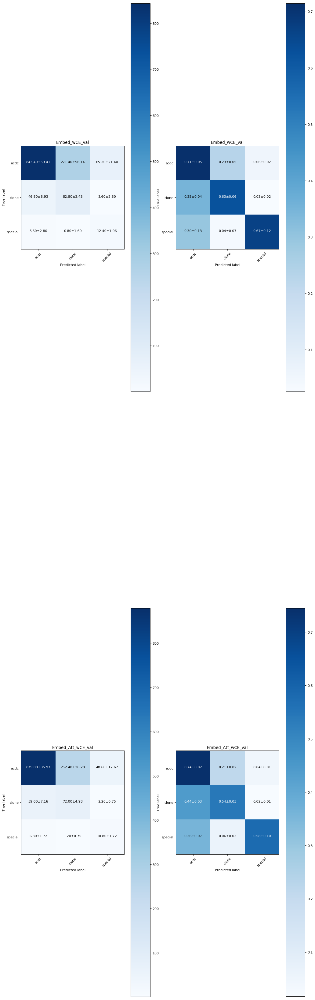

In [16]:
from keras_tensorboard.other import plot_confusion_matrixes

plot_confusion_matrixes(new_val_models,classes=list(index2action.values()),epoch_num=20)